# Data Cleaning & EDA

## Importing Libraries and Initial Checks

In [1]:
# Import necessary libraries
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from wordcloud import WordCloud
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
import numpy as np

In [2]:
# Visual Settings
pd.set_option('display.max_columns', None) # Display all columns
pd.set_option('display.max_rows', None) # Display all rows

#### Append custom module (for incorporating a custom built describex() function)
import sys
sys.path.append('path_to_module')

#### Check paths
for path in sys.path:
    print(path)

#### Load the dataset
df = pd.read_csv(r"path_to_dataset\top_10000_1960-now.csv")

In [6]:
# Data Info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9999 entries, 0 to 9998
Data columns (total 35 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Track URI             9999 non-null   object 
 1   Track Name            9998 non-null   object 
 2   Artist URI(s)         9997 non-null   object 
 3   Artist Name(s)        9998 non-null   object 
 4   Album URI             9997 non-null   object 
 5   Album Name            9998 non-null   object 
 6   Album Artist URI(s)   9997 non-null   object 
 7   Album Artist Name(s)  9997 non-null   object 
 8   Album Release Date    9997 non-null   object 
 9   Album Image URL       9995 non-null   object 
 10  Disc Number           9999 non-null   int64  
 11  Track Number          9999 non-null   int64  
 12  Track Duration (ms)   9999 non-null   int64  
 13  Track Preview URL     7102 non-null   object 
 14  Explicit              9999 non-null   bool   
 15  Popularity           

In [7]:
# Dataframe sample
df.sample(n=2)

,Track URI,Track Name,Artist URI(s),Artist Name(s),Album URI,Album Name,Album Artist URI(s),Album Artist Name(s),Album Release Date,Album Image URL,Disc Number,Track Number,Track Duration (ms),Track Preview URL,Explicit,Popularity,ISRC,Added By,Added At,Artist Genres,Danceability,Energy,Key,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Time Signature,Album Genres,Label,Copyrights
5823,spotify:track:77gYpyxmd4b4VXw6qeuPJR,Love Generation - Radio Edit,spotify:artist:5YFS41yoX0YuFY39fq21oN,Bob Sinclar,spotify:album:2SPdbgwHd6pgrS9yawBB5t,Love Generation,spotify:artist:5YFS41yoX0YuFY39fq21oN,Bob Sinclar,2009-01-01,https://i.scdn.co/image/ab67616d0000b2735cde87...,1,1,204892,https://p.scdn.co/mp3-preview/365b9f4732f500b4...,False,51,AUNV00600005,spotify:user:bradnumber1,2021-08-08T09:26:31Z,"disco house,filter house",0.716,0.882,1.0,-3.757,1.0,0.0432,0.148,0.001450,0.0744,0.469,128.084,4.0,NaN,Universal Music Australia Pty. Ltd.,"C © 2009 Ministry Of Sound Australia Pty Ltd, ..."
8714,spotify:track:3JLCBkWHjFNDBuUf0qfOkJ,To The Moon And Back,spotify:artist:3NRFinRTEqUCfaTTZmk8ek,Savage Garden,spotify:album:2FSVwM8ysmI2tXIPpBJbfs,Savage Garden,spotify:artist:3NRFinRTEqUCfaTTZmk8ek,Savage Garden,1997-03-04,https://i.scdn.co/image/ab67616d0000b2736829cf...,1,1,341226,NaN,False,0,AURQ09700001,spotify:user:bradnumber1,2021-08-08T09:26:31Z,"boy band,dance pop,pop rock",0.590,0.770,0.0,-7.363,0.0,0.0345,0.020,0.000013,0.0976,0.347,104.115,4.0,NaN,Universal Music Australia Pty. Ltd.,"C © 2015 JWM Pty Ltd, P This Compilation ℗ 201..."


In [8]:
# Call the custom defined describex function
from customda import describex
numeric_stats, non_numeric_stats = describex(df)

In [9]:
# Call the describex function for numeric stats
numeric_stats

,Count,Non-Null,Null,Mean,Median,Mode,Std,Var,Skew,Kurt,Min,25%,50%,75%,Max,Range,Outliers,Z-Score
Disc Number,9999.0,9999.0,0.0,1.035104,1.000000,1.0000,0.327856,1.074894e-01,22.250652,765.506108,0.000000,1.0000,1.000000,1.000000,15.000,1.500000e+01,233.0,0.210413
Track Number,9999.0,9999.0,0.0,4.957096,3.000000,1.0000,5.502810,3.028092e+01,3.804920,33.444799,0.000000,1.0000,3.000000,7.000000,93.000,9.300000e+01,329.0,0.691712
Track Duration (ms),9999.0,9999.0,0.0,224814.970397,219906.000000,208106.0000,54100.116070,2.926823e+09,2.986909,46.882023,0.000000,192579.5000,219906.000000,250260.000000,1561133.000,1.561133e+06,284.0,0.705425
Popularity,9999.0,9999.0,0.0,37.624662,42.000000,0.0000,29.460808,8.679392e+02,-0.056439,-1.445768,0.000000,0.0000,42.000000,64.000000,98.000,9.800000e+01,0.0,0.891903
Danceability,9997.0,9997.0,2.0,0.607925,0.617000,0.6720,0.145869,2.127784e-02,NaN,NaN,0.000000,0.5150,0.617000,0.710000,0.988,9.880000e-01,72.0,0.801369
Energy,9997.0,9997.0,2.0,0.683281,0.712000,0.8740,0.191131,3.653125e-02,NaN,NaN,0.000020,0.5600,0.712000,0.835000,0.997,9.969797e-01,51.0,0.815374
Key,9997.0,9997.0,2.0,5.167750,5.000000,0.0000,3.578392,1.280489e+01,NaN,NaN,0.000000,2.0000,5.000000,8.000000,11.000,1.100000e+01,0.0,0.871698
Loudness,9997.0,9997.0,2.0,-7.269217,-6.518000,-6.6840,3.281731,1.076976e+01,NaN,NaN,-29.368000,-9.0700,-6.518000,-4.887000,2.769,3.213700e+01,216.0,0.786340
Mode,9997.0,9997.0,2.0,0.698410,1.000000,1.0000,0.458971,2.106547e-01,NaN,NaN,0.000000,0.0000,1.000000,1.000000,1.000,1.000000e+00,0.0,0.917851
Speechiness,9997.0,9997.0,2.0,0.065138,0.042900,0.0321,0.061324,3.760614e-03,NaN,NaN,0.000000,0.0331,0.042900,0.067500,0.711,7.110000e-01,1051.0,0.618592


In [10]:
# Call the describex function for non-numeric stats
non_numeric_stats

,Count,Non-Null,Null,Unique,Top,Freq
Track URI,9999,9999,0,9951,spotify:track:4alHo6RGd0D3OUbTPExTHN,3
Track Name,9998,9998,1,8258,One,9
Artist URI(s),9997,9997,2,4134,spotify:artist:06HL4z0CvFAxyc27GXpf02,48
Artist Name(s),9998,9998,1,4129,Taylor Swift,48
Album URI,9997,9997,2,7462,spotify:album:43lok9zd7BW5CoYkXZs7S0,15
Album Name,9998,9998,1,6636,Greatest Hits,110
Album Artist URI(s),9997,9997,2,3298,spotify:artist:0LyfQWJT6nXafLPZqxe9Of,393
Album Artist Name(s),9997,9997,2,3294,Various Artists,393
Album Release Date,9997,9997,2,3332,2009-01-01,130
Album Image URL,9995,9995,4,7460,https://i.scdn.co/image/ab67616d0000b2731fc9fd...,15


## Cleaning

In [11]:
# Drop columns by index
indices_to_delete = [0,2,4,6,9,10,11,13,16,17,18,32]
df_selected_columns = df.drop(df.columns[indices_to_delete], axis=1)

In [12]:
# Display the modified DataFrame
df_selected_columns.sample(n=2)

,Track Name,Artist Name(s),Album Name,Album Artist Name(s),Album Release Date,Track Duration (ms),Explicit,Popularity,Artist Genres,Danceability,Energy,Key,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Time Signature,Label,Copyrights
9380,Natural,Imagine Dragons,Origins (Deluxe),Imagine Dragons,2018-11-09,189466,False,84,"modern rock,pop,rock",0.704,0.611,2.0,-6.112,1.0,0.0409,0.217,0.000000,0.0812,0.220,100.000,4.0,Kid Ina Korner / Interscope,"C © 2018 KIDinaKORNER/Interscope Records, P ℗ ..."
2952,Everything,Michael Bublé,Call Me Irresponsible,Michael Bublé,2007-04-30,212373,False,74,"adult standards,canadian pop,jazz pop,lounge",0.686,0.688,6.0,-4.981,0.0,0.0254,0.390,0.000001,0.0924,0.493,123.125,4.0,143/Reprise,C © 2007 Reprise Records for the U.S. and WEA ...


In [13]:
# Data info
df_selected_columns.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9999 entries, 0 to 9998
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Track Name            9998 non-null   object 
 1   Artist Name(s)        9998 non-null   object 
 2   Album Name            9998 non-null   object 
 3   Album Artist Name(s)  9997 non-null   object 
 4   Album Release Date    9997 non-null   object 
 5   Track Duration (ms)   9999 non-null   int64  
 6   Explicit              9999 non-null   bool   
 7   Popularity            9999 non-null   int64  
 8   Artist Genres         9449 non-null   object 
 9   Danceability          9997 non-null   float64
 10  Energy                9997 non-null   float64
 11  Key                   9997 non-null   float64
 12  Loudness              9997 non-null   float64
 13  Mode                  9997 non-null   float64
 14  Speechiness           9997 non-null   float64
 15  Acousticness         

In [14]:
# Reorder Columns
column_indices = [0,1,2,3,8,21,22,4,6,13,11,20,19,12,5,7,9,10,14,15,16,17,18]
df_selected_columns_reorganised = df_selected_columns.iloc[:, column_indices]

In [15]:
# Show reorganised columns
df_selected_columns_reorganised.sample(n=2)

,Track Name,Artist Name(s),Album Name,Album Artist Name(s),Artist Genres,Label,Copyrights,Album Release Date,Explicit,Mode,Key,Time Signature,Tempo,Loudness,Track Duration (ms),Popularity,Danceability,Energy,Speechiness,Acousticness,Instrumentalness,Liveness,Valence
6697,Go Away Little Girl,Steve Lawrence,Go Away Little Girl,Steve Lawrence,"adult standards,easy listening",Redwood Records,C (C) 2014 Entertain Me Europe LTD,2014-03-12,False,1.0,0.0,4.0,108.028,-15.324,136124,3,0.399,0.307,0.0347,0.733,0.0,0.1180,0.670
6792,Don't Want to Leave You,Scouting For Girls,Everybody Wants To Be On TV,Scouting For Girls,talent show,Epic,P Track 1-10 (P) 2010 Sony Music Entertainment...,2008,False,1.0,1.0,4.0,178.125,-5.787,178600,0,0.448,0.766,0.0429,0.104,0.0,0.0438,0.325


In [16]:
# Check duplicates
df_selected_columns_reorganised.duplicated().sum()

49

In [17]:
# Drop duplicates
df_selected_columns_reorganised_dd = df_selected_columns_reorganised.drop_duplicates()

In [18]:
# Check duplicates
df_selected_columns_reorganised_dd.duplicated().sum()

0

In [19]:
# Check Nulls
df_selected_columns_reorganised_dd.isnull().sum()

Track Name                1
Artist Name(s)            1
Album Name                1
Album Artist Name(s)      2
Artist Genres           549
Label                     6
Copyrights               24
Album Release Date        2
Explicit                  0
Mode                      2
Key                       2
Time Signature            2
Tempo                     2
Loudness                  2
Track Duration (ms)       0
Popularity                0
Danceability              2
Energy                    2
Speechiness               2
Acousticness              2
Instrumentalness          2
Liveness                  2
Valence                   2
dtype: int64

In [20]:
# Exclude specific columns in order to see manageable number of rows with nulls
original_order = df_selected_columns_reorganised_dd.columns.tolist()
exclude_columns = ['Artist Genres', 'Copyrights']
df_excluded_columns = df_selected_columns_reorganised_dd.drop(columns=exclude_columns)

In [21]:
# Display rows with null values
null_rows = df_excluded_columns[df_excluded_columns.isna().any(axis=1)]
null_rows

,Track Name,Artist Name(s),Album Name,Album Artist Name(s),Label,Album Release Date,Explicit,Mode,Key,Time Signature,Tempo,Loudness,Track Duration (ms),Popularity,Danceability,Energy,Speechiness,Acousticness,Instrumentalness,Liveness,Valence
563,Seven Nation Army,The White Stripes,Elephant,The White Stripes,NaN,2003-04-01,False,1.0,0.0,4.0,123.865,-7.664,231800,7,0.750,0.462,0.0779,0.00576,0.545000,0.307,0.309
1190,NaN,NaN,NaN,Various Artists,NaN,0000,False,1.0,5.0,4.0,104.019,-4.435,0,0,0.858,0.884,0.0387,0.05880,0.000000,0.121,0.963
2020,Move Your Body,Eiffel 65,Europop,Eiffel 65,NaN,1999,False,1.0,7.0,4.0,129.962,-9.664,268863,0,0.745,0.958,0.0287,0.08140,0.320000,0.533,0.960
2714,You've Got To Hide Your Love Away,The Beatles,1962-1966,NaN,NaN,NaN,False,NaN,NaN,NaN,NaN,NaN,131000,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3465,Blue (Da Ba Dee),Eiffel 65,Europop,Eiffel 65,NaN,1999,False,0.0,7.0,4.0,128.007,-11.471,283747,0,0.822,0.969,0.0582,0.25900,0.000162,0.390,0.765
5061,Too Young For Promises,Koo De Tah,Too Young For Promises,NaN,NaN,NaN,False,NaN,NaN,NaN,NaN,NaN,216000,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [22]:
# Drop specific rows
indices_to_drop = [1190,2714,5061]
df_selected_columns_reorganised_dd_dropped_indices = df_selected_columns_reorganised_dd.drop(indices_to_drop)

In [23]:
# Reinclude excluded columns in their original order
df_with_excluded_columns_back = df_excluded_columns.join(df_selected_columns_reorganised[exclude_columns])[original_order]
df_with_excluded_columns_back.sample(n=2)

,Track Name,Artist Name(s),Album Name,Album Artist Name(s),Artist Genres,Label,Copyrights,Album Release Date,Explicit,Mode,Key,Time Signature,Tempo,Loudness,Track Duration (ms),Popularity,Danceability,Energy,Speechiness,Acousticness,Instrumentalness,Liveness,Valence
554,New Americana,Halsey,BADLANDS (Deluxe),Halsey,"electropop,etherpop,indie poptimism,pop",Universal Music Group,"C © 2015 Astralwerks, P ℗ 2015 Astralwerks",2015-08-28,False,0.0,0.0,4.0,86.976,-5.106,183808,0,0.444,0.711,0.0327,0.0119,0.000000,0.340,0.371
6807,Amigos Para Siempre - Friends for Life,"Andrew Lloyd Webber, José Carreras, Sarah Brig...",Amigos Para Siempre - Friends For Life,José Carreras,"broadway,west end,classical tenor,opera,operat...",EastWest Germany,"C © 1992 eastwest records gmbh, P ℗ 1992 WARNE...",1992-07-20,False,1.0,10.0,4.0,110.210,-11.690,276133,22,0.511,0.470,0.0421,0.7000,0.000008,0.163,0.364


In [24]:
# Display rows with null values
df_selected_columns_reorganised_dd_dropped_indices.isnull().sum()

Track Name                0
Artist Name(s)            0
Album Name                0
Album Artist Name(s)      0
Artist Genres           546
Label                     3
Copyrights               21
Album Release Date        0
Explicit                  0
Mode                      0
Key                       0
Time Signature            0
Tempo                     0
Loudness                  0
Track Duration (ms)       0
Popularity                0
Danceability              0
Energy                    0
Speechiness               0
Acousticness              0
Instrumentalness          0
Liveness                  0
Valence                   0
dtype: int64

In [25]:
# Replace NaN or null values with an empty string and show info
df_filled = df_selected_columns_reorganised_dd_dropped_indices.fillna('')
df_filled_info = df_filled.isnull().sum()
df_filled_info

Track Name              0
Artist Name(s)          0
Album Name              0
Album Artist Name(s)    0
Artist Genres           0
Label                   0
Copyrights              0
Album Release Date      0
Explicit                0
Mode                    0
Key                     0
Time Signature          0
Tempo                   0
Loudness                0
Track Duration (ms)     0
Popularity              0
Danceability            0
Energy                  0
Speechiness             0
Acousticness            0
Instrumentalness        0
Liveness                0
Valence                 0
dtype: int64

In [26]:
# Updated Dataframe Sample
df_filled['Album Release Date'].sample(n=20)

6229    2017-12-08
3218    2000-09-19
6376          1988
7375    2007-01-01
1838    2003-10-20
8684    2020-03-13
7868    2019-11-07
7758    2022-03-11
9427    2003-11-18
7451    2011-10-28
2171    2008-10-24
7531    1977-01-01
3401          1987
7155    1975-07-06
2082          1984
7190    2012-08-01
4466          1980
8304    2019-08-16
7281    1998-11-08
6034    2011-01-01
Name: Album Release Date, dtype: object

In [27]:
# Extract year from 'Album Release Date', replacing the original column with the new column and save in a new dataframe
df_filled_dated = df_filled.assign(**{'Album Release Date': df_filled['Album Release Date'].apply(lambda x: pd.to_datetime(x, errors='coerce').year)}).rename(columns={'Album Release Date': 'Album Release Year'})

In [28]:
# Updated Dataframe Sample
df_filled_dated.sample(n=2)

,Track Name,Artist Name(s),Album Name,Album Artist Name(s),Artist Genres,Label,Copyrights,Album Release Year,Explicit,Mode,Key,Time Signature,Tempo,Loudness,Track Duration (ms),Popularity,Danceability,Energy,Speechiness,Acousticness,Instrumentalness,Liveness,Valence
7252,Take Over Control,"AFROJACK, Eva Simons",Take Over Control,AFROJACK,"big room,dance pop,dutch house,edm,electro hou...",Universal Music Australia Pty. Ltd.,"C © 2010 Wall Recordings / SpinninRecords, und...",2010,False,0.0,0.0,4.0,129.998,-3.443,208619,0,0.718,0.810,0.1060,0.238,0.000000,0.0933,0.653
6649,No More (Baby I'ma Do Right),3LW,3LW,3LW,"contemporary r&b,girl group,hip pop,r&b,urban ...",Epic,P (P) 2000 Sony Music Entertainment Inc.,2000,False,0.0,2.0,4.0,88.933,-7.080,263440,59,0.721,0.723,0.0631,0.102,0.000004,0.0651,0.761


In [29]:
# Count new NaN values created from the extraction
nan_count = df_filled_dated['Album Release Year'].isna().sum()
nan_count

0

In [30]:
# Rounding to 0 Decimals and Adding 1 to each value in the 'Key' column to change the range from 0-11 to 1-12

df_filled_dated['Key'] = df_filled_dated['Key'].round(0)

# Check if the maximum value in the 'Key' column is 11 or less before adding 1
if df_filled_dated['Key'].max() <= 11:
    df_filled_dated['Key'] = df_filled_dated['Key'] + 1
else:
    print("Adjustment already applied; 'Key' values are now in the range 1-12.")

In [31]:
# Call the describex function to calculate descriptive stats on the new dataframe
numeric_stats2, non_numeric_stats2 = describex(df_filled_dated)

In [32]:
# Numeric stats (describex function)
numeric_stats2

,Count,Non-Null,Null,Mean,Median,Mode,Std,Var,Skew,Kurt,Min,25%,50%,75%,Max,Range,Outliers,Z-Score
Album Release Year,9947.0,9947.0,0.0,2001.881874,2007.000000,2009.0000,15.186481,2.306292e+02,-0.915235,-0.091128,1956.000000,1993.0000,2007.000000,2014.000000,2023.000,6.700000e+01,37.0,0.815227
Mode,9947.0,9947.0,0.0,0.698100,1.000000,1.0000,0.459105,2.107776e-01,-0.863026,-1.255186,0.000000,0.0000,1.000000,1.000000,1.000,1.000000e+00,0.0,0.918118
Key,9947.0,9947.0,0.0,6.170202,6.000000,1.0000,3.579620,1.281368e+01,0.029006,-1.288886,1.000000,3.0000,6.000000,9.000000,12.000,1.100000e+01,0.0,0.871826
Time Signature,9947.0,9947.0,0.0,3.960290,4.000000,4.0000,0.251541,6.327311e-02,-5.429289,51.816756,0.000000,4.0000,4.000000,4.000000,5.000,5.000000e+00,470.0,0.349852
Tempo,9947.0,9947.0,0.0,121.490949,120.634000,125.9830,26.268564,6.900374e+02,0.529937,0.303239,0.000000,102.5710,120.634000,134.325500,217.913,2.179130e+02,229.0,0.771190
Loudness,9947.0,9947.0,0.0,-7.265634,-6.516000,-6.6840,3.282953,1.077778e+01,-1.041832,1.222898,-29.368000,-9.0600,-6.516000,-4.881500,2.769,3.213700e+01,215.0,0.786069
Track Duration (ms),9947.0,9947.0,0.0,224845.754800,219946.000000,208106.0000,54023.543196,2.918543e+09,3.010624,47.339242,91226.000000,192666.0000,219946.000000,250220.000000,1561133.000,1.469907e+06,284.0,0.705541
Popularity,9947.0,9947.0,0.0,37.573037,42.000000,0.0000,29.427228,8.659618e+02,-0.054312,-1.443449,0.000000,0.0000,42.000000,64.000000,98.000,9.800000e+01,0.0,0.891643
Danceability,9947.0,9947.0,0.0,0.607791,0.617000,0.6720,0.145883,2.128179e-02,-0.313800,-0.078342,0.000000,0.5150,0.617000,0.710000,0.988,9.880000e-01,72.0,0.801034
Energy,9947.0,9947.0,0.0,0.683346,0.712000,0.8740,0.191170,3.654605e-02,-0.638541,-0.168026,0.000020,0.5600,0.712000,0.836000,0.997,9.969797e-01,49.0,0.815365


In [33]:
# Non-numeric stats (describex function)
non_numeric_stats2

,Count,Non-Null,Null,Unique,Top,Freq
Track Name,9947,9947,0,8256,One,9
Artist Name(s),9947,9947,0,4128,Taylor Swift,48
Album Name,9947,9947,0,6634,Greatest Hits,109
Album Artist Name(s),9947,9947,0,3294,Various Artists,391
Artist Genres,9947,9947,0,2816,,546
Label,9947,9947,0,1466,Universal Music Group,840
Copyrights,9947,9947,0,5379,"C © 2009 Parlophone Records Ltd, a Warner Musi...",28
Explicit,9947,9947,0,2,False,9440


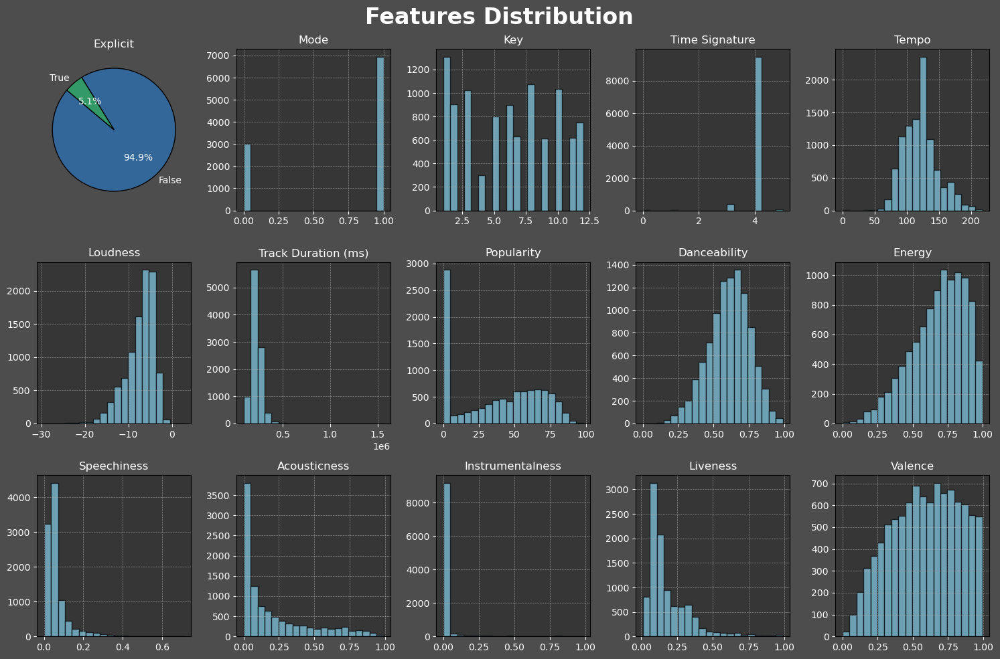

In [34]:
# Features Distribution plot (Facet Grid)

# Create a figure and axes for the histograms and pie chart
fig, axs = plt.subplots(3, 5, figsize=(15, 10))
axs = axs.flatten()  # Flatten the axes array for easy indexing

# Plot pie chart for the boolean column
bool_counts = df_filled_dated.iloc[:, 8].value_counts()
axs[0].pie(bool_counts, labels=bool_counts.index, autopct='%1.1f%%', startangle=140, colors=['#336699', '#339966'],
           textprops={'color':'white'}, wedgeprops={"edgecolor":"black", "linewidth":1})
axs[0].set_title(df_filled_dated.columns[8], color='white')


# Plot histograms for numeric columns, starting from the second subplot
numeric_columns = df_filled_dated.columns[9:23]
for i, col in enumerate(numeric_columns):
    df_filled_dated[col].hist(ax=axs[i+1], bins=20, color='skyblue', alpha=0.7, edgecolor='black')
    axs[i+1].set_title(col, color='white')
    axs[i+1].grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

# Set overall title with increased gap
fig.suptitle("Features Distribution", fontsize=24, color='white', y=0.98, weight='bold')

# Set background color and adjust subplot settings
fig.patch.set_facecolor('#4d4d4d')  # Set figure background to black
for ax in axs:
    ax.set_facecolor('#363636')  # Set axes background to dark grey
    ax.tick_params(axis='x', colors='white')  # Set x-axis label color to white
    ax.tick_params(axis='y', colors='white')  # Set y-axis label color to white

# Adjust layout, save and show the plot
plt.tight_layout()
plt.show()

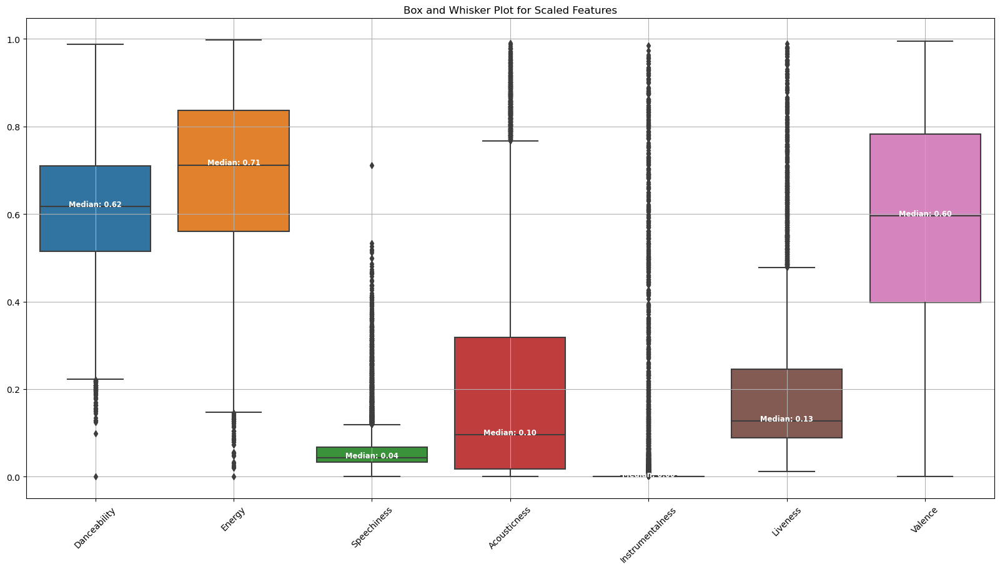

In [35]:
# Scaled numeric columns (Boxplot)

numeric_columns = df_filled_dated.columns[16:23]
plt.figure(figsize=(20,10))
sns.boxplot(data=df_filled_dated[numeric_columns])
plt.xticks(rotation=45)
plt.title("Box and Whisker Plot for Scaled Features")
plt.grid(True)

# Annotating each box with the median value
for i, column in enumerate(numeric_columns):
    # Calculate medians
    median = df_filled_dated[column].median()
    
    # Positioning the text in the middle of the box
    plt.text(i, median, f'Median: {median:.2f}', 
             horizontalalignment='center', size='small', color='w', weight='semibold')
plt.show()

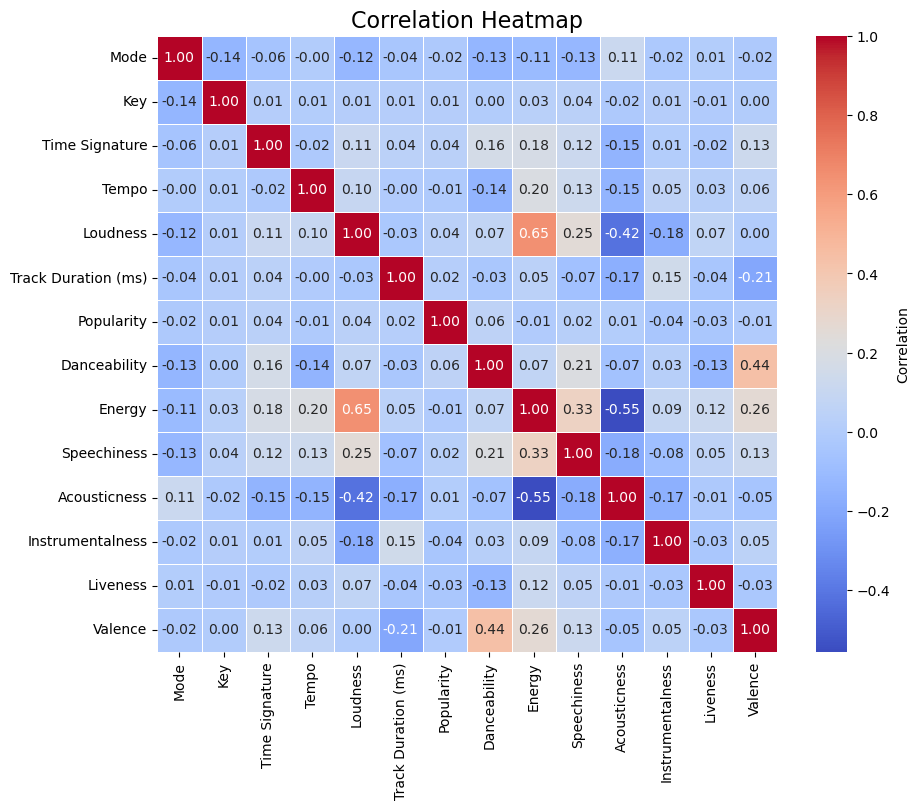


Significant Correlations (Threshold: 0.4)


,Feature 1,Feature 2,Correlation
,Danceability,Valence,0.440466
,Energy,Loudness,0.646272
,Acousticness,Loudness,-0.416903
,Acousticness,Energy,-0.554907


In [36]:
# Correlation Heatmap with significant pairs

# Select specific columns for correlation analysis
selected_columns = df_filled_dated.columns[9:23]
selected_df2 = df_filled_dated[selected_columns]

# Compute Spearman correlation
corr_matrix = selected_df2.corr(method='spearman')

# Define a threshold for significant correlations
threshold = 0.4

# Find pairs with correlation above the threshold (ignoring self-correlation)
significant_pairs = corr_matrix.stack().reset_index()
significant_pairs.columns = ['Feature 1', 'Feature 2', 'Correlation']
significant_pairs = significant_pairs[significant_pairs['Feature 1'] != significant_pairs['Feature 2']]
significant_pairs = significant_pairs[significant_pairs['Correlation'].abs() > threshold]
significant_pairs = significant_pairs[significant_pairs['Feature 1'] < significant_pairs['Feature 2']]

# Display heatmap
plt.figure(figsize=(10, 8))
heatmap = sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", linewidths=.5, cbar_kws={'label': 'Correlation'}, fmt=".2f")
plt.title("Correlation Heatmap", color='black', fontsize=16)
plt.gca().set_facecolor('#363636')
plt.show()

# Display significant correlation pairs
print("\nSignificant Correlations (Threshold: {})".format(threshold))
significant_pairs.index = [''] * len(significant_pairs)
display(significant_pairs)

# Analysis

In [37]:
# Display Updated (Cleaned) Dataframe Columns
df_filled_dated.columns

Index(['Track Name', 'Artist Name(s)', 'Album Name', 'Album Artist Name(s)',
       'Artist Genres', 'Label', 'Copyrights', 'Album Release Year',
       'Explicit', 'Mode', 'Key', 'Time Signature', 'Tempo', 'Loudness',
       'Track Duration (ms)', 'Popularity', 'Danceability', 'Energy',
       'Speechiness', 'Acousticness', 'Instrumentalness', 'Liveness',
       'Valence'],
      dtype='object')

## Track Analysis

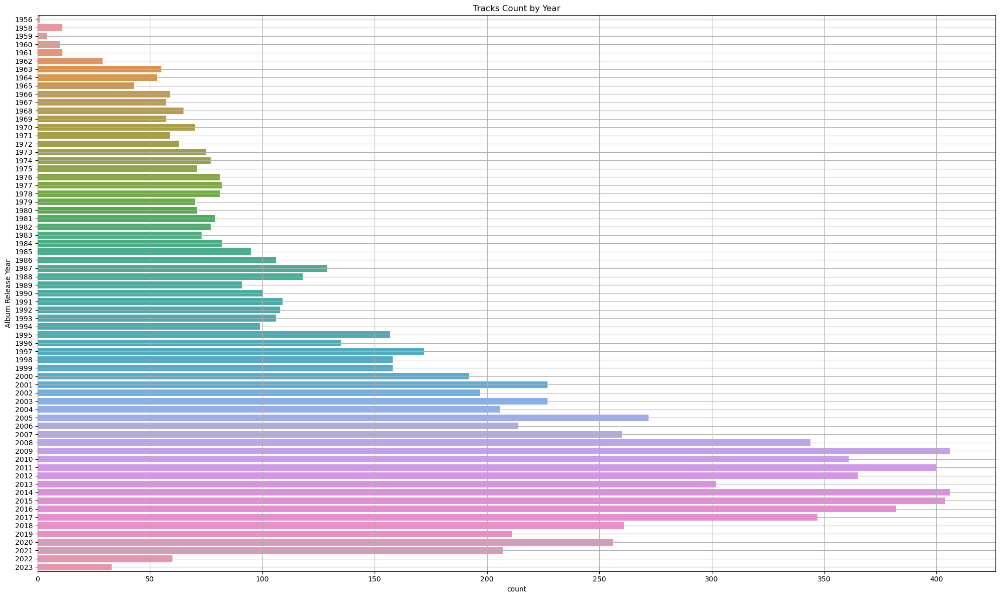

In [38]:
# Tracks Count by Year (Bar plot)
plt.figure(figsize=(20, 12))
sns.countplot(y='Album Release Year', data=df_filled_dated)
plt.grid(True)
plt.title('Tracks Count by Year')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

In [39]:
# Create a new column 'Song' combining track and artist names
df_filled_dated['Song'] = df_filled_dated['Track Name'] + " - " + df_filled_dated['Album Artist Name(s)']

In [40]:
def top_songs_all_time(df_filled_dated, n):
    df_filled_dated['Popularity'] = df_filled_dated['Popularity'].astype(float)
    
    # Group, aggregate, and sort
    top_songs_avg = (df_filled_dated.groupby(['Song', 'Artist Name(s)'], as_index=False)
                     .agg({'Popularity': 'mean', 'Album Release Year': 'first'})
                     .sort_values(by=['Popularity', 'Album Release Year'], ascending=[False, True])
                     .head(n))
    
    avg_popularity = top_songs_avg['Popularity'].mean()
    
    # Format and prepare for display
    top_songs_avg = (top_songs_avg.assign(Popularity=lambda x: x['Popularity'].apply("{:.2f}".format))
                     .rename(columns={'Album Release Year': 'Release Year'})
                     [['Release Year', 'Song', 'Artist Name(s)', 'Popularity']]
                     .reset_index(drop=True))
    
    top_songs_avg.index = [''] * len(top_songs_avg)  # Hide index
    
    return top_songs_avg, avg_popularity

# Display the DataFrame and average popularity
top_songs_df, avg_popularity = top_songs_all_time(df_filled_dated, 100)
pd.set_option('display.max_rows', None) # Display all rows
print("Top 100 Songs of All Time (Popularity Wise) - Distinct Songs with Average Popularity\n")
top_songs_df

Top 100 Songs of All Time (Popularity Wise) - Distinct Songs with Average Popularity



,Release Year,Song,Artist Name(s),Popularity
,2023,vampire - Olivia Rodrigo,Olivia Rodrigo,98.00
,2023,Cupid - Twin Ver. - FIFTY FIFTY,FIFTY FIFTY,97.00
,2022,Anti-Hero - Taylor Swift,Taylor Swift,95.00
,2022,Creepin' (with The Weeknd & 21 Savage) - Metro...,"Metro Boomin, The Weeknd, 21 Savage",95.00
,2022,I Ain't Worried - OneRepublic,OneRepublic,95.00
,2022,"I'm Good (Blue) - David Guetta, Bebe Rexha","David Guetta, Bebe Rexha",95.00
,2023,Dance The Night (From Barbie The Album) - Dua ...,Dua Lipa,95.00
,2022,"Calm Down (with Selena Gomez) - Rema, Selena G...","Rema, Selena Gomez",94.00
,2023,"Baby Don't Hurt Me - David Guetta, Anne-Marie,...","David Guetta, Anne-Marie, Coi Leray",94.00
,2000,Yellow - Coldplay,Coldplay,93.00


In [41]:
# Top Songs of All Time over Years (Popularity Wise)

def prepare_pivot_top_tracks(df_filled_dated, top_n):
    # Dropping duplicates and calculating mean popularity for distinct songs
    df_unique_songs = df_filled_dated.drop_duplicates(subset=['Song', 'Album Release Year'])
    df_unique_songs = df_unique_songs.assign(MeanPopularity=df_unique_songs.groupby(['Song', 'Album Release Year'])['Popularity'].transform('mean'))
    
    # Selecting top N songs per year based on mean popularity
    df_top_songs = df_unique_songs.sort_values(by=['Album Release Year', 'MeanPopularity'], ascending=[True, False])
    df_top_songs['Rank'] = df_top_songs.groupby('Album Release Year')['MeanPopularity'].rank(method='first', ascending=False)
    df_filtered = df_top_songs[df_top_songs['Rank'] <= top_n]
    
    # Pivoting to get the desired format
    pivot_df = df_filtered.pivot(index='Album Release Year', columns='Rank', values='Song').fillna('')
    pivot_df.columns = [f'Top #{int(x)}' for x in pivot_df.columns]
    
    return pivot_df.sort_index(ascending=False)

pivot_top_tracks = prepare_pivot_top_tracks(df_filled_dated, 10)
pd.set_option('display.max_rows', None) # Display all rows
print("Top Songs of All Time over Years (Popularity Wise)\n")
pivot_top_tracks

Top Songs of All Time over Years (Popularity Wise)



,Top #1,Top #2,Top #3,Top #4,Top #5,Top #6,Top #7,Top #8,Top #9,Top #10
Album Release Year,,,,,,,,,,
2023,vampire - Olivia Rodrigo,Cupid - Twin Ver. - FIFTY FIFTY,Flowers - Miley Cyrus,Dance The Night (From Barbie The Album) - Dua ...,"Baby Don't Hurt Me - David Guetta, Anne-Marie,...",Fast Car - Luke Combs,"Miracle (with Ellie Goulding) - Calvin Harris,...",Last Night - Morgan Wallen,Lay Low - Tiësto,Push Up - Main Edit - Creeds
2022,I Ain't Worried - OneRepublic,Creepin' (with The Weeknd & 21 Savage) - Metro...,Anti-Hero - Taylor Swift,"I'm Good (Blue) - David Guetta, Bebe Rexha","Calm Down (with Selena Gomez) - Rema, Selena G...",As It Was - Harry Styles,Until I Found You (with Em Beihold) - Em Beiho...,SNAP - Rosa Linn,"Unholy (feat. Kim Petras) - Sam Smith, Kim Petras",Bones - Imagine Dragons
2021,"Where Are You Now - Lost Frequencies, Calum Scott","Cold Heart - PNAU Remix - Elton John, Dua Lipa...","Sunroof - Nicky Youre, dazy",Love Story (Taylor’s Version) - Taylor Swift,Leave Before You Love Me (with Jonas Brothers)...,THATS WHAT I WANT - Lil Nas X,Easy On Me - Adele,Do It To It - ACRAZE,Save Your Tears (with Ariana Grande) (Remix) -...,abcdefu - GAYLE
2020,Blinding Lights - The Weeknd,Heather - Conan Gray,Levitating (feat. DaBaby) - Dua Lipa,you broke me first - Tate McRae,Don't Start Now - Dua Lipa,Levitating - Dua Lipa,Godzilla (feat. Juice WRLD) - Eminem,"death bed (coffee for your head) - Powfu, beab...",Heartbreak Anniversary - Giveon,Stuck with U (with Justin Bieber) - Ariana Gra...
2019,Lover - Taylor Swift,Circles - Post Malone,Sunflower - Spider-Man: Into the Spider-Verse ...,Before You Go - Lewis Capaldi,The Man - Taylor Swift,Adore You - Harry Styles,7 rings - Ariana Grande,everything i wanted - Billie Eilish,HIGHEST IN THE ROOM - Travis Scott,Shameless - Camila Cabello
2018,"lovely (with Khalid) - Billie Eilish, Khalid",Sunflower - Spider-Man: Into the Spider-Verse ...,Let Me Down Slowly - Alec Benjamin,"One Kiss (with Dua Lipa) - Calvin Harris, Dua ...",God's Plan - Drake,"Shallow - Lady Gaga, Bradley Cooper","All The Stars (with SZA) - Kendrick Lamar, SZA",Lucid Dreams - Juice WRLD,SICKO MODE - Travis Scott,rockstar (feat. 21 Savage) - Post Malone
2017,Perfect - Ed Sheeran,Shape of You - Ed Sheeran,Something Just Like This - The Chainsmokers,HUMBLE. - Kendrick Lamar,Too Good At Goodbyes - Sam Smith,Beggin' - Måneskin,Mask Off - Future,New Rules - Dua Lipa,IDGAF - Dua Lipa,Lush Life - Zara Larsson
2016,That's What I Like - Bruno Mars,"Closer - The Chainsmokers, Halsey","This Is What You Came For - Calvin Harris, Rih...",We Don't Talk Anymore (feat. Selena Gomez) - C...,7 Years - Lukas Graham,Heathens - Twenty One Pilots,"In the Name of Love - Martin Garrix, Bebe Rexha",I Fall Apart - Post Malone,Don't Let Me Down - The Chainsmokers,Can I Be Him - James Arthur
2015,Stressed Out - Twenty One Pilots,Love Yourself - Justin Bieber,The Less I Know The Better - Tame Impala,Hymn for the Weekend - Coldplay,See You Again (feat. Charlie Puth) - Wiz Khali...,Ride - Twenty One Pilots,Uptown Funk (feat. Bruno Mars) - Mark Ronson,Sorry - Justin Bieber,Centuries - Fall Out Boy,Stitches - Shawn Mendes


## Artist Analysis

In [42]:
# Artists with Top Tracks of All Time over Years (Count Wise)

def prepare_pivot_top_artists_by_song_count(df_filled_dated, top_n):
    # Ensuring uniqueness and calculating song count per artist and year
    artist_details = (df_filled_dated.drop_duplicates(['Song', 'Album Release Year', 'Album Artist Name(s)'])
                      .groupby(['Album Release Year', 'Album Artist Name(s)'])
                      .agg(Distinct_Song_Count=('Song', 'count'))
                      .reset_index()
                      .sort_values(by=['Album Release Year', 'Distinct_Song_Count'], ascending=[True, False]))
    
    # Assigning rank within each year based on distinct song count
    artist_details['Rank'] = artist_details.groupby('Album Release Year')['Distinct_Song_Count'].rank(method='first', ascending=False)
    
    # Filtering for top N per year
    top_artists = artist_details[artist_details['Rank'] <= top_n].copy()
    
    # Formatting artist details to include song counts
    top_artists['ArtistWithSongCount'] = (top_artists['Album Artist Name(s)'] + ' (' + 
                                          top_artists['Distinct_Song_Count'].astype(str) + ')')
    
    # Pivoting for final display
    pivot_table = (top_artists.pivot(index='Album Release Year', columns='Rank', values='ArtistWithSongCount')
                   .fillna(''))

    # Renaming columns to 'Top #' without explicitly using 'Rank'
    pivot_table.columns = [f'Top #{int(col)}' for col in pivot_table.columns]

    return pivot_table.sort_index(ascending=False)

# Usage
pivot_top_artists_by_song_count = prepare_pivot_top_artists_by_song_count(df_filled_dated, top_n=10)
print("Artists with Top Tracks of All Time over Years (Count Wise)\n")
pivot_top_artists_by_song_count

Artists with Top Tracks of All Time over Years (Count Wise)



,Top #1,Top #2,Top #3,Top #4,Top #5,Top #6,Top #7,Top #8,Top #9,Top #10
Album Release Year,,,,,,,,,,
2023,Luke Combs (2),Macklemore (2),P!nk (2),Tiësto (2),Budjerah (1),"Calvin Harris, Ellie Goulding (1)",Creeds (1),David Guetta (1),"David Guetta, Anne-Marie, Coi Leray (1)",Dua Lipa (1)
2022,Dean Lewis (2),Imagine Dragons (2),Lizzo (2),Amy Shark (1),"Besomorph, Lucifer (1)",Beyoncé (1),Camila Cabello (1),"Camila Cabello, Ed Sheeran (1)",Charlie Puth (1),Coi Leray (1)
2021,Ed Sheeran (4),Justin Bieber (4),Amy Shark (3),Billie Eilish (3),Olivia Rodrigo (3),Taylor Swift (3),The KLF (3),"Bruno Mars, Anderson .Paak, Silk Sonic (2)",Caramel Blue (2),Demi Lovato (2)
2020,Dua Lipa (9),Various Artists (9),5 Seconds of Summer (4),Guy Sebastian (4),The Weeknd (4),Ariana Grande (3),Ava Max (3),Conan Gray (3),Justin Bieber (3),Katy Perry (3)
2019,Various Artists (10),Ed Sheeran (6),Billie Eilish (5),Harry Styles (5),Taylor Swift (5),Dean Lewis (4),Lewis Capaldi (4),Post Malone (4),Lizzo (3),P!nk (3)
2018,Various Artists (15),Olivia Newton-John (8),Ariana Grande (6),Jess Glynne (4),Post Malone (4),Shawn Mendes (4),5 Seconds of Summer (3),Amy Shark (3),Bazzi (3),Brian Cadd (3)
2017,Various Artists (25),Ed Sheeran (8),Taylor Swift (7),Zara Larsson (6),Dua Lipa (4),John Mayer (4),Sam Smith (4),Daryl Braithwaite (3),Elvis Presley (3),Imagine Dragons (3)
2016,Various Artists (28),Michael Bublé (9),Dami Im (8),Birdy (7),James Arthur (7),Alicia Keys (5),Charlie Puth (5),Sia (5),Alessia Cara (4),Ariana Grande (4)
2015,Various Artists (33),Justin Bieber (11),Adele (8),Mariah Carey (6),Meghan Trainor (6),Normie Rowe (5),One Direction (5),Years & Years (5),Charlie Puth (4),Conrad Sewell (4)


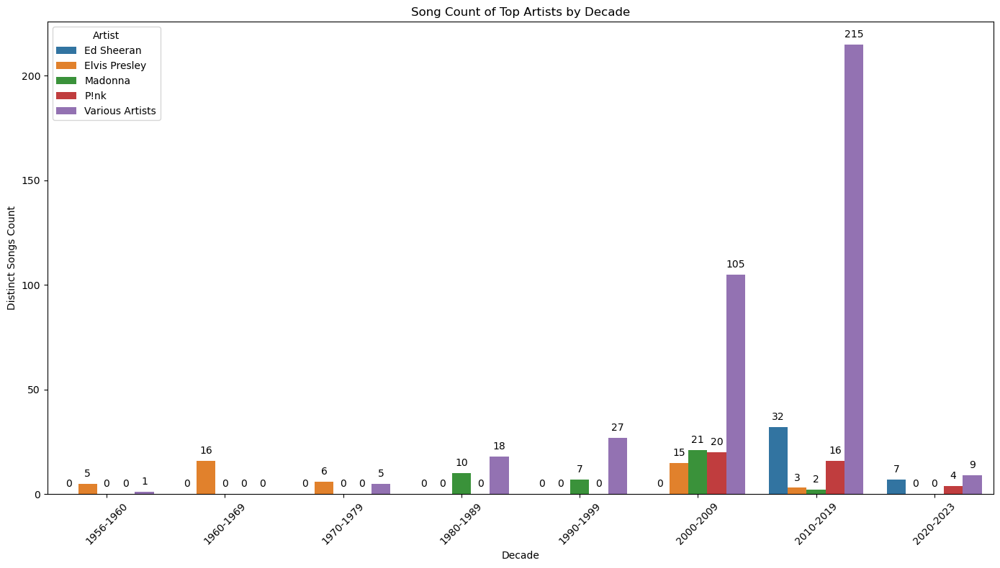

In [43]:
# Count of Top Artists by Decade (Bar Plot)

# Adjusting the bins and labels for decades
bins = [1956] + list(range(1960, 2021, 10)) + [2024]
labels = ['1956-1960'] + [f"{i}-{i+9}" for i in range(1960, 2020, 10)] + ['2020-2023']

# Assigning decades
df_filled_dated['Decade'] = pd.cut(df_filled_dated['Album Release Year'], bins=bins, labels=labels, right=False)

# Dropping duplicates to ensure distinct song counts
df_distinct_songs = df_filled_dated.drop_duplicates(subset=['Song', 'Album Artist Name(s)', 'Decade'])

# Grouping by Decade and Artist, then counting distinct songs and averaging popularity
artist_decade_stats = df_distinct_songs.groupby(['Decade', 'Album Artist Name(s)']).agg(
    Distinct_Songs=('Song', 'count'),
    Avg_Popularity=('Popularity', 'mean')
).reset_index()

# Selecting top N artists based on distinct song count for simplicity in visualization
top_artists = artist_decade_stats.groupby('Album Artist Name(s)')['Distinct_Songs'].sum().nlargest(5).index.tolist()

# Filtering data for only these top artists
df_top_artists_decades = artist_decade_stats[artist_decade_stats['Album Artist Name(s)'].isin(top_artists)]

# Creating the bar chart
plt.figure(figsize=(14, 8))
ax = sns.barplot(x='Decade', y='Distinct_Songs', hue='Album Artist Name(s)', data=df_top_artists_decades, errorbar=None)

plt.title('Song Count of Top Artists by Decade')
plt.xlabel('Decade')
plt.ylabel('Distinct Songs Count')
plt.xticks(rotation=45)
plt.legend(title='Artist', loc='upper left')

# Annotating bars with the distinct song count
for p in ax.patches:
    ax.annotate(f"{int(p.get_height())}",
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 10), textcoords='offset points')

plt.tight_layout()
plt.show()

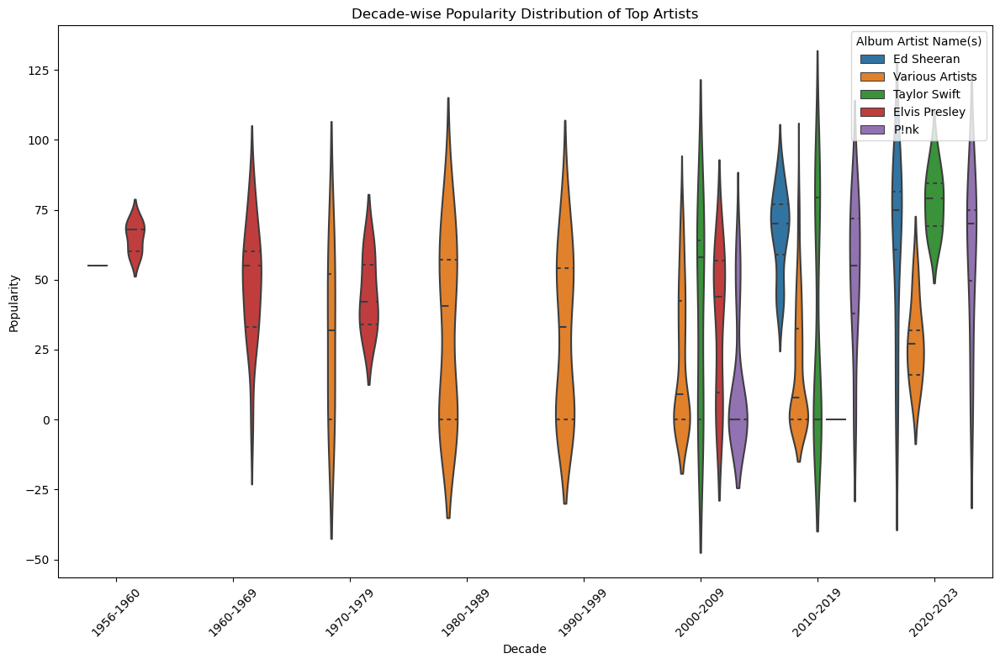

In [44]:
# Popularity Distribution of Top Artists by Decade (Violin Plot)

# Adjusting bins and labels
bins = [1956] + list(range(1960, 2021, 10)) + [2024]
labels = ['1956-1960'] + [f"{i}-{i+9}" for i in range(1960, 2020, 10)] + ['2020-2023']

# Assigning the intervals
df_filled_dated['Decade'] = pd.cut(df_filled_dated['Album Release Year'],
                                   bins=bins,
                                   labels=labels,
                                   right=False)

# Select top 5 artists for simplicity in visualization
top_artists = df_filled_dated['Album Artist Name(s)'].value_counts().head(5).index.tolist()

# Filter data for only top artists
df_top_artists = df_filled_dated[df_filled_dated['Album Artist Name(s)'].isin(top_artists)]

plt.figure(figsize=(12, 8))
sns.violinplot(x='Decade', y='Popularity', hue='Album Artist Name(s)',
               data=df_top_artists, inner="quart", linewidth=1.5)
plt.title('Decade-wise Popularity Distribution of Top Artists')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()

## Album Analysis

In [45]:
# Top Albums over Years (Count Wise and Popularity Wise)

def top_albums_per_interval(df_filled_dated, n):
    bins = [1956] + list(range(1960, 2021, 10)) + [2024]
    labels = ['1956-1960'] + [f"{i}-{i+9}" for i in range(1960, 2020, 10)] + ['2020-2023']
    
    # Assigning the intervals
    df_filled_dated['Decade'] = pd.cut(df_filled_dated['Album Release Year'],
                                     bins=bins,
                                     labels=labels,
                                     right=False)  # Ensure the right edge is exclusive
    
    # Create a new column that combines 'Album Name' and 'Album Artist Name(s)'
    df_filled_dated['Album Artist'] = df_filled_dated['Album Name'] + " - " + df_filled_dated['Album Artist Name(s)']
    
    # Group by Interval and Combined Album_Artist, then count and sort by count and popularity
    count_top_albums = df_filled_dated.groupby(['Decade', 'Album Artist']).size().reset_index(name='Count')
    count_top_albums = count_top_albums.sort_values(['Decade', 'Count'], ascending=[False, False])

    popularity_top_albums = df_filled_dated.groupby(['Decade', 'Album Artist'])['Popularity'].mean().reset_index()
    
    # Round-off popularity mean
    popularity_top_albums['Popularity'] = popularity_top_albums['Popularity'].round(2)

    popularity_top_albums = popularity_top_albums.sort_values(['Decade', 'Popularity'], ascending=[False, False])

    # Get top n albums by count and by popularity for each interval
    top_albums_count = count_top_albums.groupby('Decade').head(n).set_index('Decade')
    top_albums_popularity = popularity_top_albums.groupby('Decade').head(n).set_index('Decade')

    # Combine both top n DataFrames for a comprehensive view
    combined = pd.concat([top_albums_count, top_albums_popularity], axis=1, keys=['Top Count', 'Top Popularity'])

    return combined

# Usage
top_albums_df = top_albums_per_interval(df_filled_dated, 5)
print("Top Albums over Years (count wise and popularity wise)\n")
top_albums_df

Top Albums over Years (count wise and popularity wise)



Top Count        \
                                                Album Artist Count   
Decade                                                               
2020-2023                        Future Nostalgia - Dua Lipa     7   
2020-2023                           After Hours - The Weeknd     6   
2020-2023                            Heaven & Hell - Ava Max     3   
2020-2023                            Justice - Justin Bieber     3   
2020-2023                      Solid State Logik 1 - The KLF     3   
2010-2019                   Purpose (Deluxe) - Justin Bieber    15   
2010-2019                      RnB Fridays - Various Artists    11   
2010-2019                                         21 - Adele    10   
2010-2019                  Doo-Wops & Hooligans - Bruno Mars     9   
2010-2019             Nobody but Me (Deluxe) - Michael Bublé     9   
2000-2009        Celebration (double disc version) - Madonna    15   
2000-2009                      Been Waiting - Jessica Mauboy    10   
2000-2009                       Greatest Hits - Foo Fighters    10   
2000-2009                               Greatest Hits - Five     9   
2000-2009                 U218 Singles (Deluxe Version) - U2     9   
1990-1999                Ladies & Gentlemen - George Michael     7   
1990-1999                        Come On Over - Shania Twain     6   
1990-1999                     Enema Of The State - blink-182     6   
1990-1999                              Metallica - Metallica     6   
1990-1999                          On The 6 - Jennifer Lopez     6   
1980-1989                      Crowded House - Crowded House     6   
1980-1989                       Slippery When Wet - Bon Jovi     6   
1980-1989                     Diesel And Dust - Midnight Oil     5   
1980-1989                             Faith - George Michael     5   
1980-1989              The Best Of Gene Pitney - Gene Pitney     5   
1970-1979                                     Arrival - ABBA     6   
1970-1979                                Greatest - Bee Gees     6   
1970-1979  The Definitive Collection - David Cassidy, The...     6   
1970-1979                   40 Golden Greats - Cliff Richard     5   
1970-1979                                        Abba - ABBA     5   
1960-1969  Young Girl: The Best Of Gary Puckett & The Uni...     5   
1960-1969      A Hard Day's Night (Remastered) - The Beatles     4   
1960-1969              From Elvis in Memphis - Elvis Presley     4   
1960-1969                        It's 2 Easy - The Easybeats     4   
1960-1969    Magical Mystery Tour (Remastered) - The Beatles     4   
1956-1960              Elvis' Golden Records - Elvis Presley     4   
1956-1960                          Buddy Holly - Buddy Holly     3   
1956-1960                          Bobby Darin - Bobby Darin     1   
1956-1960                      Elvis Presley - Elvis Presley     1   
1956-1960                         Greatest Hits - The Crests     1   

                                              Top Popularity             
                                                Album Artist Popularity  
Decade                                                                   
2020-2023                           vampire - Olivia Rodrigo       98.0  
2020-2023                 The Beginning: Cupid - FIFTY FIFTY       97.0  
2020-2023                              Flowers - Miley Cyrus       96.0  
2020-2023  Dance The Night (From Barbie The Album) - Dua ...       95.0  
2020-2023                   HEROES & VILLAINS - Metro Boomin       95.0  
2010-2019  Spider-Man: Into the Spider-Verse (Soundtrack ...       91.0  
2010-2019       lovely (with Khalid) - Billie Eilish, Khalid       91.0  
2010-2019                   Narrated For You - Alec Benjamin       90.0  
2010-2019  One Kiss (with Dua Lipa) - Calvin Harris, Dua ...       89.0  
2010-2019                             Currents - Tame Impala       88.0  
2000-2009                              Parachutes - Coldplay       93.0  
2000

## Label Analysis

In [46]:
# Top Labels over Years (count wise and popularity wise)

def top_labels_per_interval(df_filled_dated, n):

# Adjusted bins and labels according to the new requirements
    bins = [1956] + list(range(1960, 2021, 10)) + [2024]
    labels = ['1956-1960'] + [f"{i}-{i+9}" for i in range(1960, 2020, 10)] + ['2020-2023']
    
    # Assigning the intervals
    df_filled_dated['Decade'] = pd.cut(df_filled_dated['Album Release Year'],
                                         bins=bins,
                                         labels=labels,
                                         right=False)  # Ensure the right edge is exclusive
    
    # Group by Interval and labels, then count and sort by count and popularity
    count_top_labels = df_filled_dated.groupby(['Decade', 'Label']).size().reset_index(name='Count')
    count_top_labels = count_top_labels.sort_values(['Decade', 'Count'], ascending=[False, False])

    popularity_top_labels = df_filled_dated.groupby(['Decade', 'Label'])['Popularity'].mean().reset_index()
    popularity_top_labels['Popularity'] = popularity_top_labels['Popularity'].round(2)  # Round-off popularity mean
    popularity_top_labels = popularity_top_labels.sort_values(['Decade', 'Popularity'], ascending=[False, False])

    # Get top n labels by count and by popularity for each interval
    top_labels_count = count_top_labels.groupby('Decade').head(n).set_index('Decade')
    top_labels_popularity = popularity_top_labels.groupby('Decade').head(n).set_index('Decade')

    # Combine both top n DataFrames for a comprehensive view
    combined = pd.concat([top_labels_count, top_labels_popularity], axis=1, keys=['Top Count', 'Top Popularity'])
    # combined.index = [''] * len(combined)  # Hide index

    return combined

# Usage
top_labels_df = top_labels_per_interval(df_filled_dated, 5)
print("Top Labels over Years (count wise and popularity wise)\n")
top_labels_df

Top Labels over Years (count wise and popularity wise)



Top Count        \
                                         Label Count   
Decade                                                 
2020-2023                     Republic Records    30   
2020-2023                    RCA Records Label    27   
2020-2023                             Columbia    25   
2020-2023                       Warner Records    24   
2020-2023                  Atlantic Records UK    22   
2010-2019                Universal Music Group   377   
2010-2019             Sony Music Entertainment   180   
2010-2019  Universal Music Australia Pty. Ltd.   142   
2010-2019                    RCA Records Label   124   
2010-2019                             Columbia   123   
2000-2009                Universal Music Group   225   
2000-2009                             Columbia   113   
2000-2009  Universal Music Australia Pty. Ltd.    90   
2000-2009                    RCA Records Label    86   
2000-2009                        Parlophone UK    70   
1990-1999                Universal Music Group    99   
1990-1999                             Columbia    86   
1990-1999                         WM Australia    50   
1990-1999                                 Epic    46   
1990-1999                        Parlophone UK    44   
1980-1989                Universal Music Group    83   
1980-1989                             Columbia    63   
1980-1989                         WM Australia    41   
1980-1989                        Parlophone UK    39   
1980-1989                      Capitol Records    31   
1970-1979                 Rhino/Warner Records    33   
1970-1979                             Columbia    29   
1970-1979                        Parlophone UK    29   
1970-1979                         WM Australia    26   
1970-1979                       Rhino Atlantic    23   
1960-1969                Universal Music Group    34   
1960-1969                        EMI Catalogue    28   
1960-1969                           RCA/Legacy    24   
1960-1969                      Capitol Records    22   
1960-1969                       Rhino Atlantic    19   
1956-1960                    RCA Records Label     4   
1956-1960                               Geffen     3   
1956-1960                      Columbia/Legacy     2   
1956-1960                       Rhino Atlantic     2   
1956-1960                    Brunswick Records     1   

                                              Top Popularity             
                                                       Label Popularity  
Decade                                                                   
2020-2023                                           WM Korea      97.00  
2020-2023                      Mavin Records / Jonzing World      94.00  
2020-2023  Big Loud Records / Mercury Records / Republic ...      90.50  
2020-2023                          Uptown / Republic Records      88.00  
2020-2023                                    Musical Freedom      87.00  
2010-2019                                               2018      90.00  
2010-2019                            G.O.O.D. Music/Columbia      88.00  
2010-2019                  Cactus Jack / Epic / Grand Hustle      87.00  
2010-2019                       Juice WRLD Mixtape / ISR P&D      87.00  
2010-2019      A$AP Worldwide/Polo Grounds Music/RCA Records      86.00  
2000-2009                                     Island Def Jam      85.00  
2000-2009                                    Epic/Interscope      81.00  
2000-2009                                             Uptown      81.00  
2000-2009                         Parlophone Records Limited      80.67  
2000-2009                                        Modjo Music      80.00  
1990-1999                                    Concord Records      87.00  
1990-1999                                   Guns N Roses P&D      81.50  
1990-1999                                      Epic/Immortal      80.00  
1990-1999                                      Immortal/Epic      80.00  


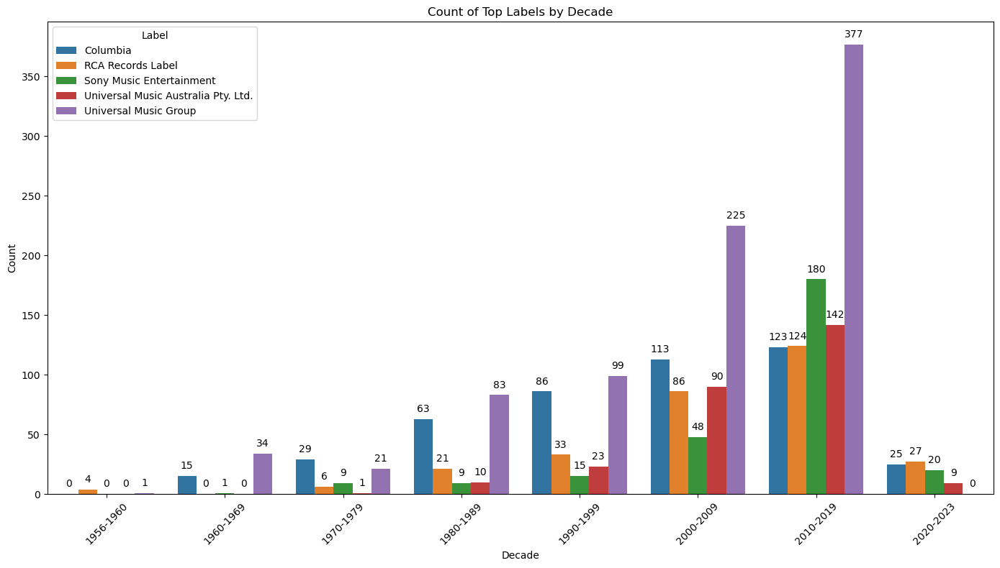

In [47]:
# Count of Top Labels by Decade (Bar Plot)

# Adjusting bins and labels
bins = [1956] + list(range(1960, 2021, 10)) + [2024]
labels = ['1956-1960'] + [f"{i}-{i+9}" for i in range(1960, 2020, 10)] + ['2020-2023']

# Assigning the intervals
df_filled_dated['Decade'] = pd.cut(df_filled_dated['Album Release Year'],
                                   bins=bins,
                                   labels=labels,
                                   right=False)

# Select top N labels for simplicity in visualization
top_labels = df_filled_dated['Label'].value_counts().head(5).index.tolist()

# Filter data for only top labels
df_top_labels = df_filled_dated[df_filled_dated['Label'].isin(top_labels)]

# Count appearances of labels in each interval
count_by_decade = df_top_labels.groupby(['Decade', 'Label']).size().reset_index(name='Count')

# Create a bar chart
plt.figure(figsize=(14, 8))
ax = sns.barplot(x='Decade', y='Count', hue='Label', data=count_by_decade)

plt.title('Count of Top Labels by Decade')
plt.xlabel('Decade')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.legend(title='Label', loc='upper left')  # Correctly adjust legend position outside

# Loop through each bar in the plot and add a label
for p in ax.patches:
    ax.annotate(f"{int(p.get_height())}",
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 10), textcoords='offset points')

plt.tight_layout()  # Adjust layout to make sure everything fits without overlapping
plt.show()

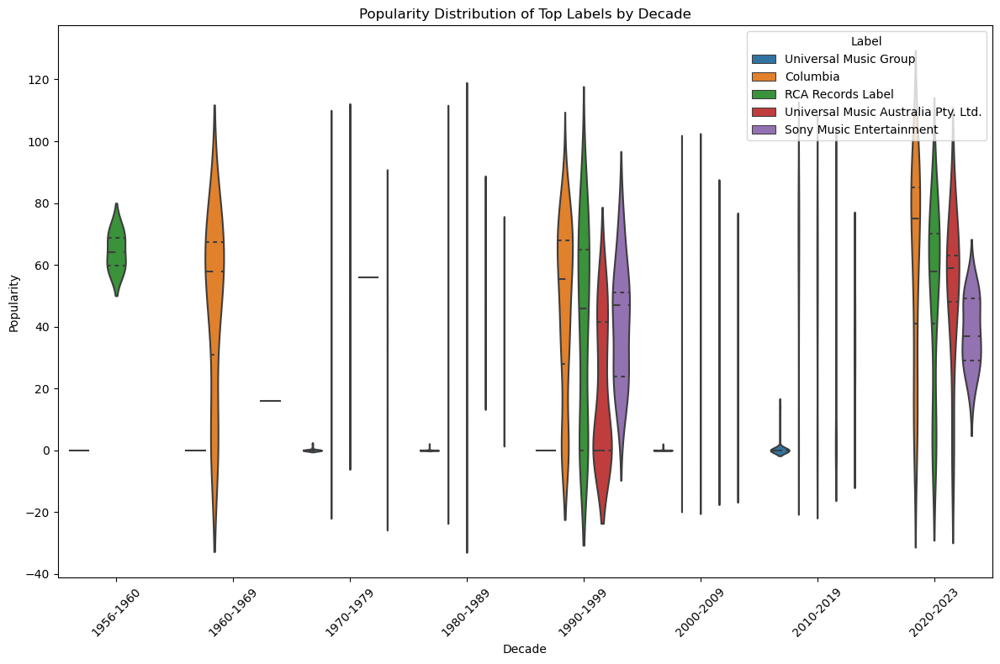

In [48]:
# Popularity Distribution of Top Labels by Decade (Violin Plot)

# Adjusting the bins and labels
bins = [1956] + list(range(1960, 2021, 10)) + [2024]
labels = ['1956-1960'] + [f"{i}-{i+9}" for i in range(1960, 2020, 10)] + ['2020-2023']

# Assigning the intervals
df_filled_dated['Decade'] = pd.cut(df_filled_dated['Album Release Year'],
                                   bins=bins,
                                   labels=labels,
                                   right=False)

# Select top N artists for simplicity in visualization
top_labels = df_filled_dated['Label'].value_counts().head(5).index.tolist()

# Filter data for only top artists
df_top_labels = df_filled_dated[df_filled_dated['Label'].isin(top_labels)]

plt.figure(figsize=(12, 8))
sns.violinplot(x='Decade', y='Popularity', hue='Label',
               data=df_top_labels, inner="quart", linewidth=1.5)
plt.title('Popularity Distribution of Top Labels by Decade')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()

## Genre Analysis

In [49]:
# Categorizing and Counting Genres

# Function to categorize genres
def categorize_genre(genres):
    if 'pop' in genres:
        return 'Pop'
    elif 'hip hop' in genres or 'rap' in genres:
        return 'Hip-Hop'
    elif 'rock' in genres:
        return 'Rock'
    else:
        return 'Other'

df_filled_dated['Broad Genre'] = df_filled_dated['Artist Genres'].apply(categorize_genre)

# Count of songs per broad genre
genre_counts = df_filled_dated['Broad Genre'].value_counts()

# Display counts without showing the column title
print("CBroad Genre Categories:\n")
for genre, count in genre_counts.items():
    print(f"{genre}: {count}")

Count of Songs by Broad Genre Categories:

Pop: 5545
Rock: 2304
Other: 1827
Hip-Hop: 271


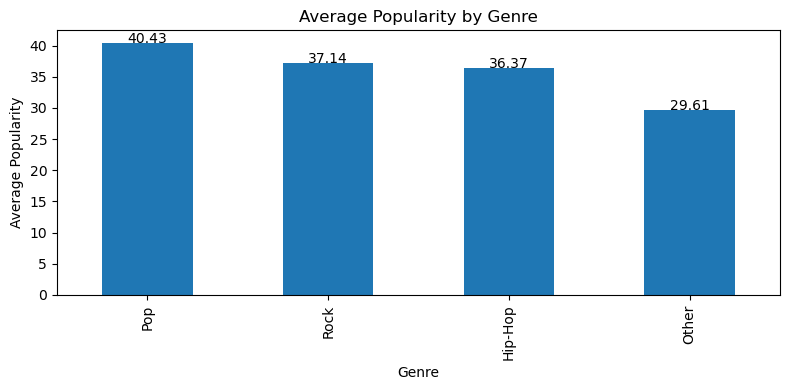

In [50]:
# Average Popularity by Genre (Bar Chart)

genre_popularity = df_filled_dated.groupby('Broad Genre')['Popularity'].mean().sort_values(ascending=False)
genre_popularity.plot(kind='bar', figsize=(8, 4))

plt.xlabel('Genre')
plt.ylabel('Average Popularity')
plt.title('Average Popularity by Genre')

for index, value in enumerate(genre_popularity):
    plt.text(index, value, f"{value:.2f}", ha='center')

plt.tight_layout()
plt.show()

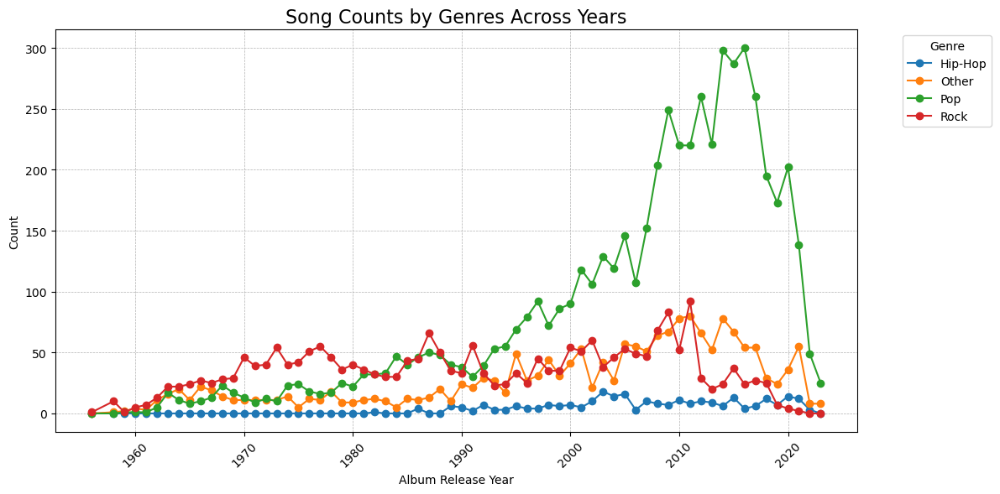

In [51]:
# Genre Counts Across Years (Line Graph)

# Group by year and genre, then count occurrences
year_genre_count = df_filled_dated.groupby(['Album Release Year', 'Broad Genre']).size().unstack(fill_value=0)

# Plotting
year_genre_count.plot(kind='line', marker='o', linestyle='-', figsize=(12, 6))
plt.title('Song Counts by Genres Across Years', fontsize=16)
plt.xlabel('Album Release Year')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotate x-ticks for better readability
plt.legend(title='Genre', bbox_to_anchor=(1.05, 1), loc='upper left')  # Adjust legend position outside the plot
plt.grid(True, which='both', linestyle='--', linewidth=0.5)  # Optional: Add grid for better readability
plt.tight_layout()  # Adjust layout to make sure everything fits without overlapping
plt.show()

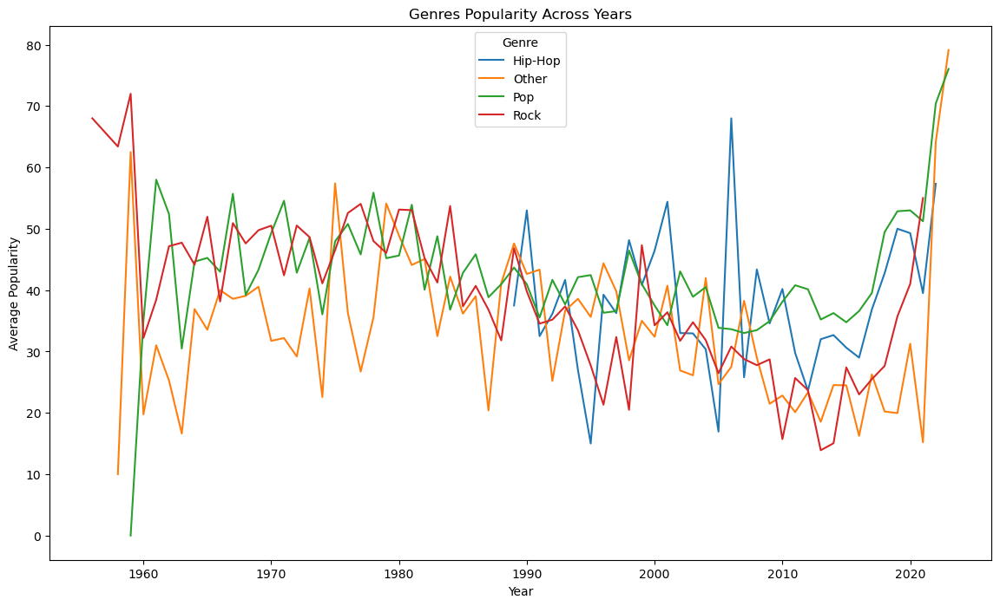

In [52]:
# Genres Popularity Across Years (Line Graph)

year_genre_popularity = df_filled_dated.groupby(['Album Release Year', 'Broad Genre'])['Popularity'].mean().unstack()

top_genres = year_genre_popularity.columns[:10]
year_genre_popularity[top_genres].plot(kind='line', figsize=(14, 8))

plt.title('Genres Popularity Across Years')
plt.ylabel('Average Popularity')
plt.xlabel('Year')
plt.legend(title='Genre', loc='upper center')
plt.show()

C:\Users\Admin\anaconda3\envs\musicanalysis\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


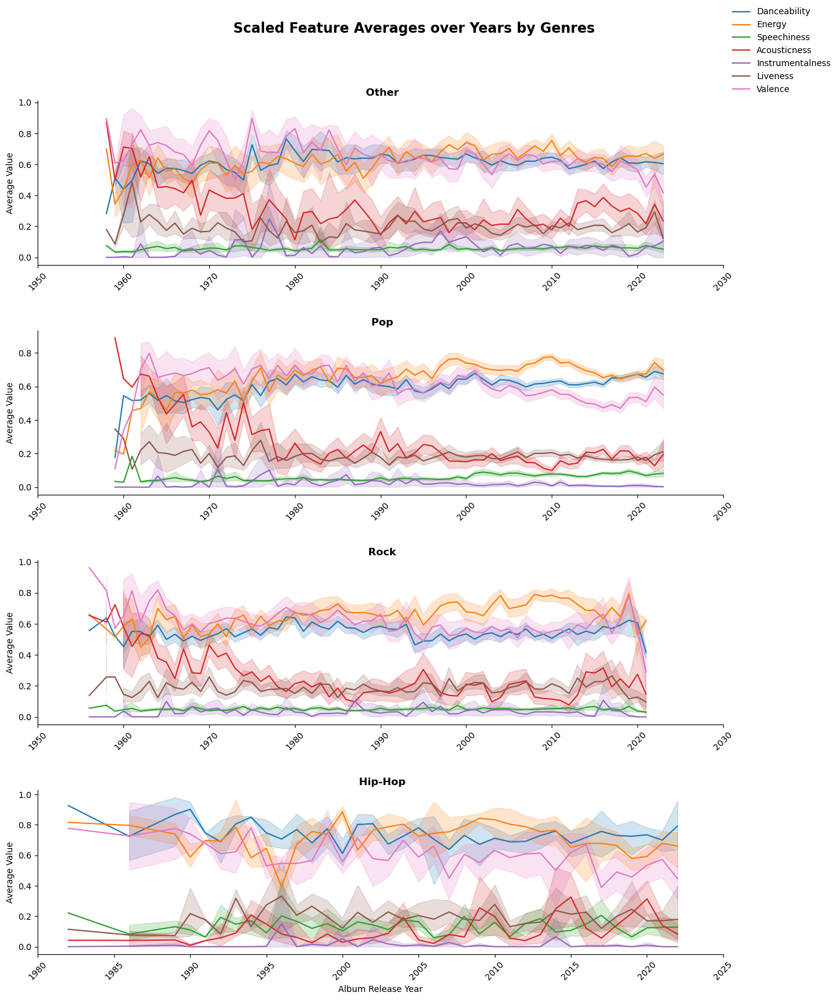

In [53]:
# Scaled Feature Averages over Years by Genres (Facet Grid)

# Melting the DataFrame for scaled features
df_long_scaled = df_filled_dated.melt(id_vars=['Album Release Year', 'Broad Genre'],
                                      value_vars=df_filled_dated.columns[16:23],
                                      var_name='Feature',
                                      value_name='Average Value')

# Plotting
g_scaled = sns.FacetGrid(df_long_scaled, col="Broad Genre", col_wrap=1, height=4, aspect=12/4, sharex=False, sharey=False)
g_scaled.map_dataframe(sns.lineplot, x='Album Release Year', y='Average Value', hue='Feature')
g_scaled.add_legend(loc='upper right')

# Rotate x-ticks and adjust layout for clarity
g_scaled.set_xticklabels(rotation=45)
g_scaled.fig.subplots_adjust(top=0.9, hspace=0.4)

# Set main title with bold weight
g_scaled.fig.suptitle('Scaled Feature Averages over Years by Genres', fontsize=16, weight='bold')

# Adjust title for each subplot with semibold weight
for ax in g_scaled.axes.flatten():
    ax.set_title(ax.get_title().split('=')[1], weight='semibold')

plt.show()

C:\Users\Admin\anaconda3\envs\musicanalysis\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


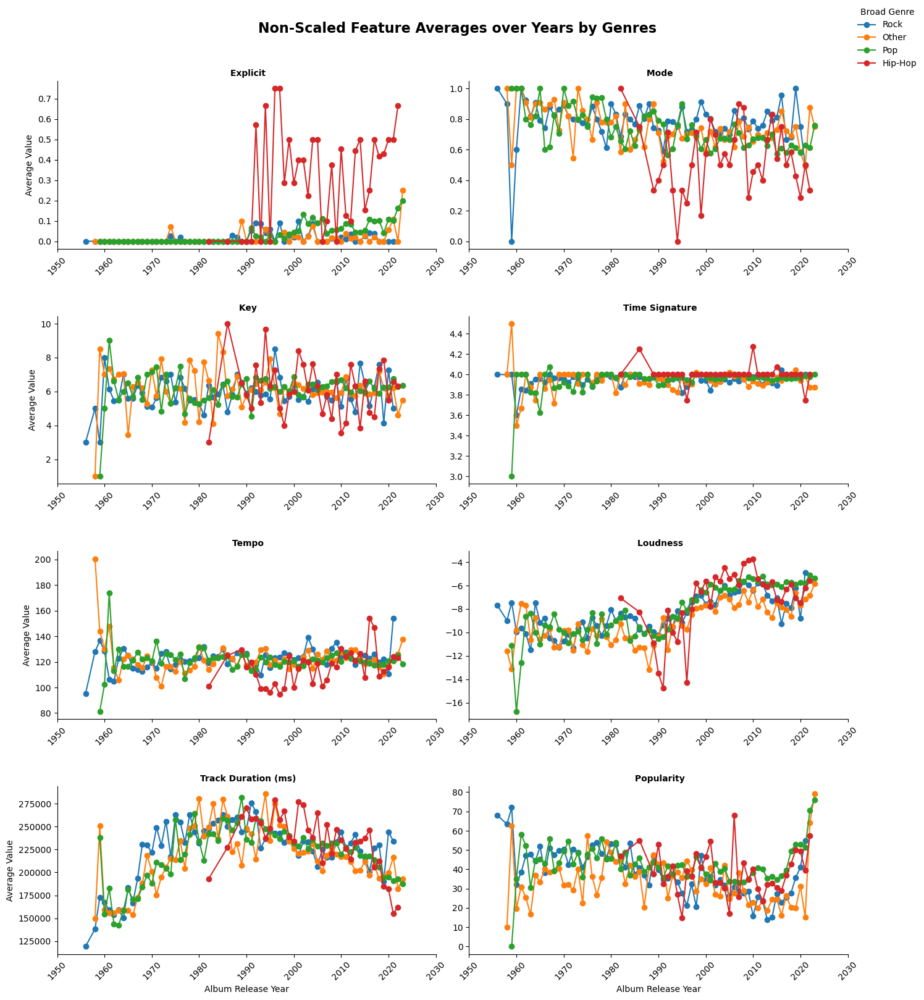

In [54]:
# Non-Scaled Feature Averages over Years by Genres (Facet Grid)

# Define the non-scaled features columns, adjust indices as per your DataFrame structure
non_scaled_features = df_filled_dated.columns[8:16]  # Example indices for non-scaled features

# Calculate the mean for non-scaled features grouped by 'Album Release Year' and 'Broad Genre'
df_avg_non_scaled = df_filled_dated.groupby(['Album Release Year', 'Broad Genre'])[non_scaled_features].mean().reset_index()

# Melt the averaged DataFrame to a long format for plotting
df_long_non_scaled_avg = df_avg_non_scaled.melt(id_vars=['Album Release Year', 'Broad Genre'],
                                                var_name='Feature',
                                                value_name='Average Value')

# Plotting the FacetGrid for non-scaled feature averages over years by genres
g_non_scaled_avg = sns.FacetGrid(df_long_non_scaled_avg, col="Feature", hue="Broad Genre", col_wrap=2, height=4, aspect=7/4, sharex=False, sharey=False)
g_non_scaled_avg.map(plt.plot, 'Album Release Year', 'Average Value', marker="o")
g_non_scaled_avg.add_legend(loc='upper right')

# Rotate x-ticks for better readability and adjust subplot titles to prevent overlap
g_non_scaled_avg.set_xticklabels(rotation=45)
g_non_scaled_avg.fig.subplots_adjust(top=0.92, hspace=0.4)
g_non_scaled_avg.fig.suptitle('Non-Scaled Feature Averages over Years by Genres', fontsize=16, weight='bold')

# Adjust title for each subplot and tweak layout for clarity
for ax in g_non_scaled_avg.axes.flatten():
    ax.set_title(ax.get_title().split('=')[1], fontsize=10, weight='semibold')
    ax.title.set_position([0.5, 1.05])

plt.show()

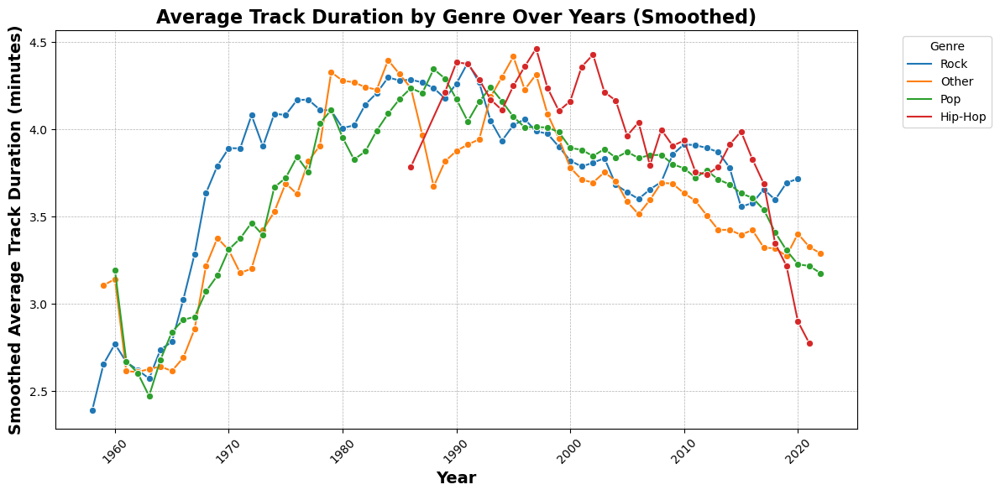

In [55]:
# Average Track Duration by Genre Over Years (Smoothed Line Graph)

# Convert 'Track Duration (ms)' to minutes for readability
df_filled_dated['Track Duration (Minutes)'] = df_filled_dated['Track Duration (ms)'] / 60000

# Calculate the average track duration by year and genre
year_genre_avg_duration = df_filled_dated.groupby(['Album Release Year', 'Broad Genre'])['Track Duration (Minutes)'].mean().reset_index()

# Apply the rolling average with a window of 3 as previously attempted
rolling_window = 3  # Define the size of the rolling window
year_genre_avg_duration['Smoothed Duration'] = year_genre_avg_duration.groupby('Broad Genre')['Track Duration (Minutes)'].transform(lambda x: x.rolling(rolling_window, center=True).mean())

# Plot the smoothed average track duration by genre over the years
plt.figure(figsize=(12, 6))
sns.lineplot(x='Album Release Year', y='Smoothed Duration', hue='Broad Genre', data=year_genre_avg_duration, marker='o')

plt.title('Average Track Duration by Genre Over Years (Smoothed)', fontsize=16, weight='bold')
plt.xlabel('Year', fontsize=14, weight='semibold')
plt.ylabel('Smoothed Average Track Duration (minutes)', fontsize=14, weight='semibold')
plt.legend(title='Genre', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## Misc Analysis

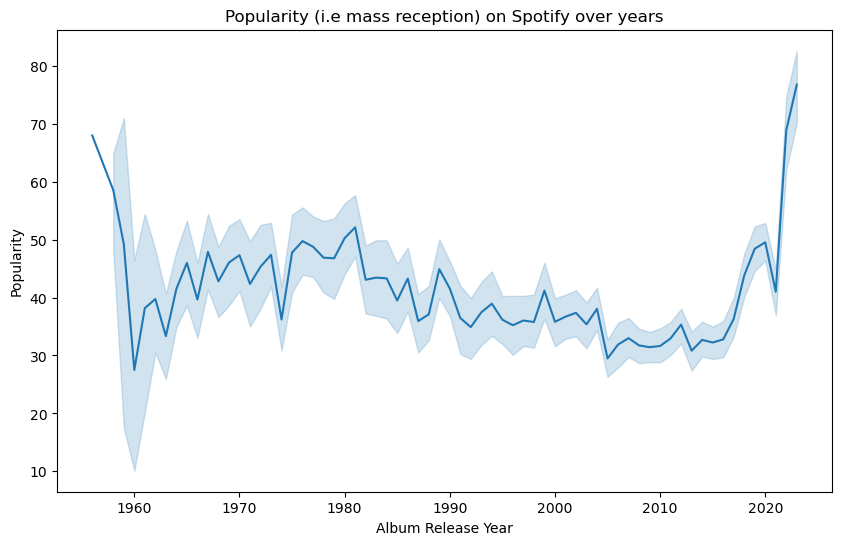

In [56]:
# Popularity (i.e mass reception) on Spotify over years (Line Plot)
plt.figure(figsize=(10, 6))
sns.lineplot(x='Album Release Year', y='Popularity', data=df_filled_dated)
plt.title('Popularity (i.e mass reception) on Spotify over years')
plt.show()

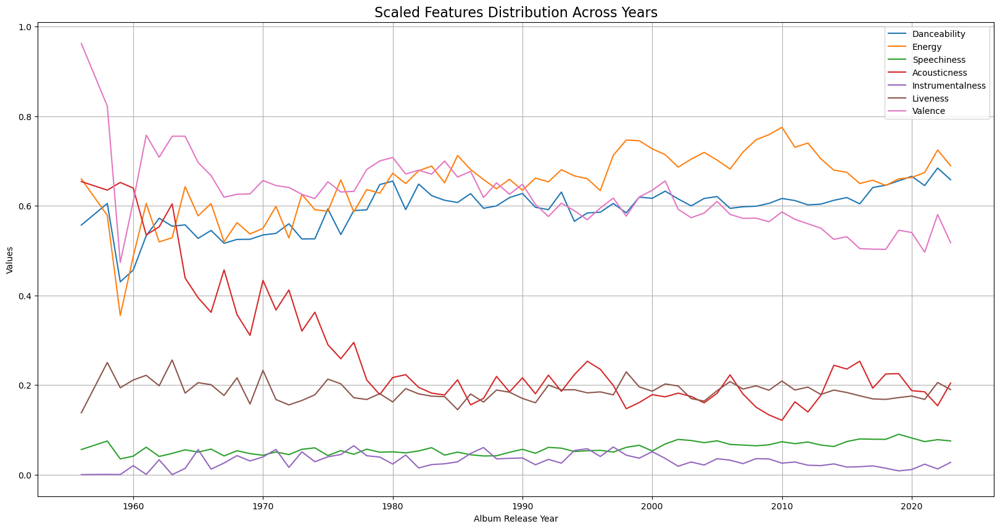

In [57]:
# Scaled Features Distribution Across Years (Line Plot)
columns_to_plot = df_filled_dated.columns[16:23]
release_year = df_filled_dated['Album Release Year']

# Creating the plot
plt.figure(figsize=(20, 10))

for col in columns_to_plot:
    # Group by 'Album Release Year' and take the mean for each year
    yearly_data = df_filled_dated.groupby(release_year)[col].mean()
    plt.plot(yearly_data, label=col)

plt.title('Scaled Features Distribution Across Years', fontsize=16)
plt.xlabel('Album Release Year')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

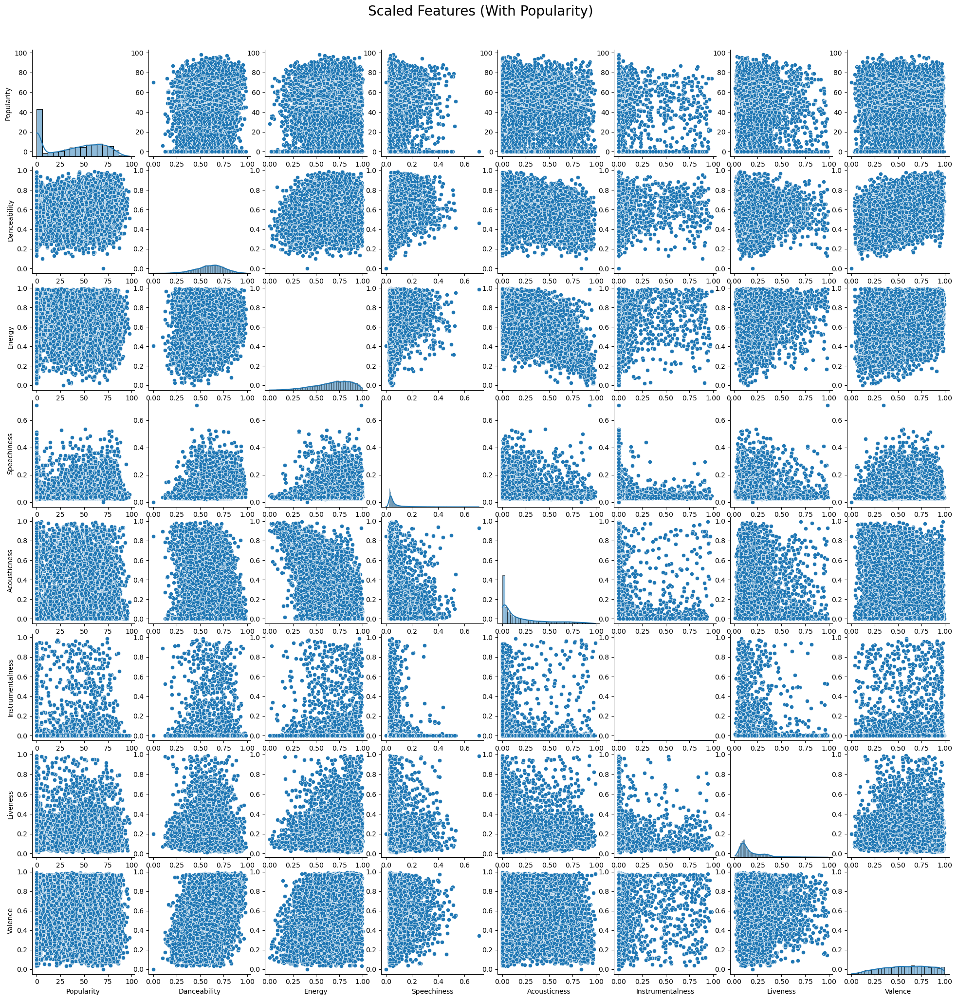

In [58]:
# Scaled Features (With Popularity) (Pair Plots Facet Grid)

# Selecting the columns for the plot
columns_to_plot = df_filled_dated.columns[15:23]  # Indices 15 to 22

# Creating the pair grid
g = sns.PairGrid(df_filled_dated[columns_to_plot])
g.map_upper(sns.scatterplot)
g.map_lower(sns.scatterplot)
g.map_diag(sns.histplot, kde=True)

# Adding a title inside the figure. Adjust 'y' for title position
g.fig.suptitle('Scaled Features (With Popularity)', fontsize=20, y=1.03)

# Adjust layout for better readability
for ax in g.axes.flatten():
    ax.tick_params(labelbottom=True, labelleft=True)

plt.show()

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


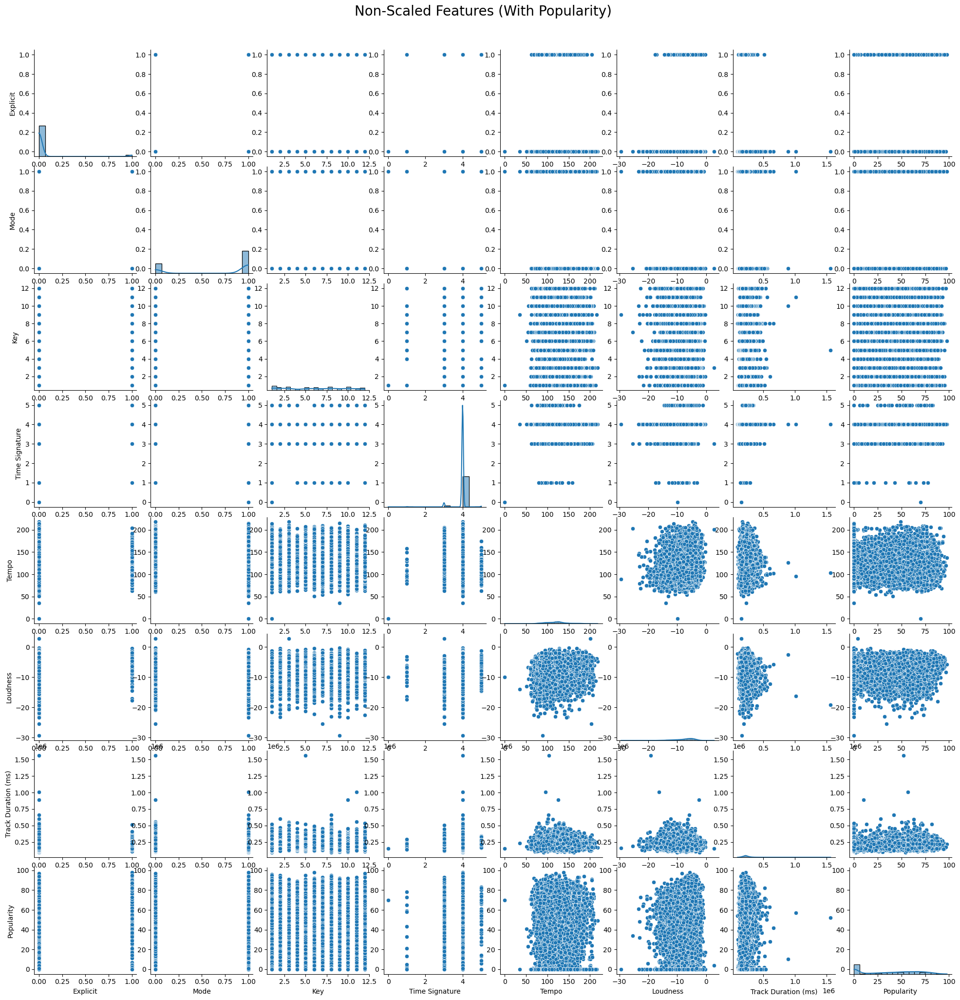

In [59]:
# Non-Scaled Features (With Popularity) (Pair Plots Facet Grid)

# Selecting the columns for the plot
columns_to_plot = df_filled_dated.columns[8:16]

# Creating the pair grid
g = sns.PairGrid(df_filled_dated[columns_to_plot])
g.map_upper(sns.scatterplot)
g.map_lower(sns.scatterplot)
g.map_diag(sns.histplot, kde=True)

# Adding a title
g.fig.suptitle('Non-Scaled Features (With Popularity)', fontsize=20, y=1.03)

# Adjust layout for better readability
for ax in g.axes.flatten():
    ax.tick_params(labelbottom=True, labelleft=True)

plt.show()

C:\Users\Admin\anaconda3\envs\musicanalysis\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


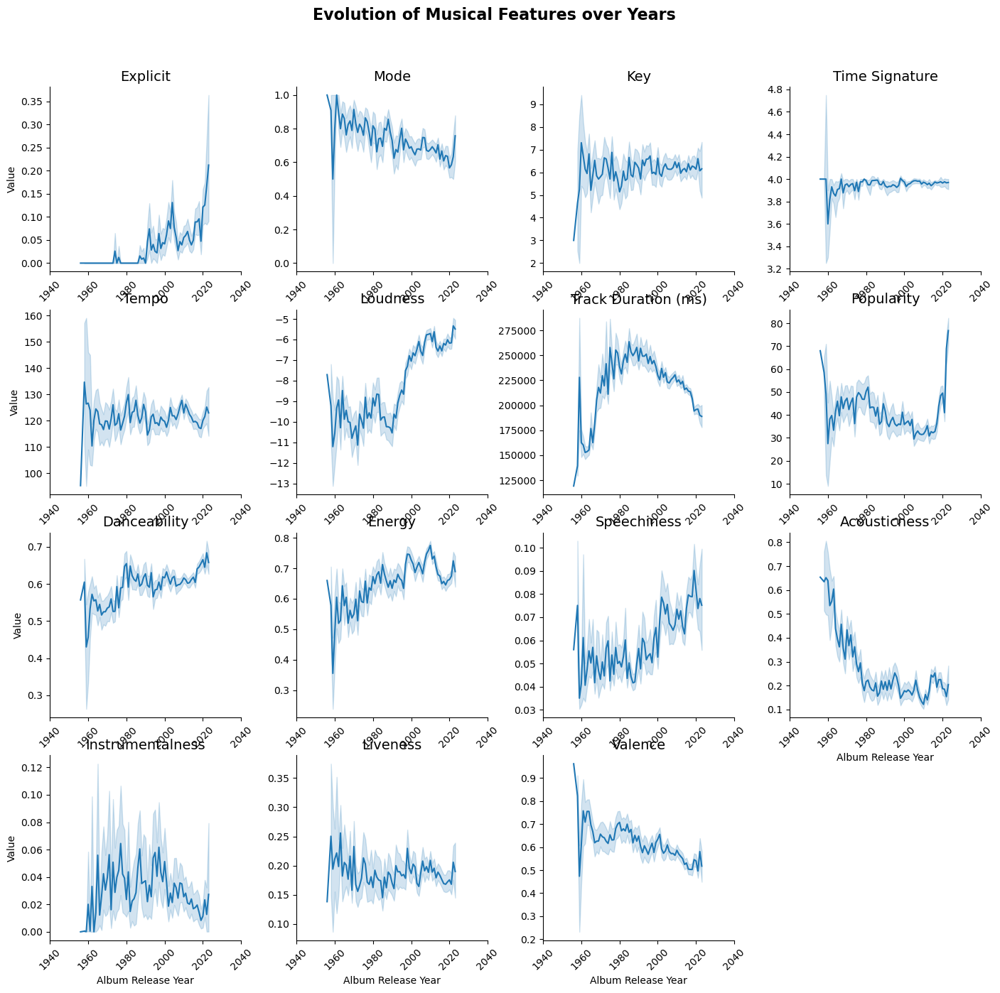

In [60]:
# Evolution of Musical Features over Years (Line Plot Facet Grid)


features = df_filled_dated.columns[8:23]
df_long = pd.melt(df_filled_dated, id_vars=['Album Release Year'], value_vars=features, var_name='Feature', value_name='Value')

# Create a FacetGrid
g = sns.FacetGrid(df_long, col='Feature', col_wrap=4, sharex=False, sharey=False, height=3.5)

# Add the line plots
g = g.map(sns.lineplot, 'Album Release Year', 'Value')

# Adjust the titles and axis labels
g.set_titles("{col_name}", size=14)
g.set_axis_labels("Album Release Year", "Value")
g.set_xticklabels(rotation=45)

# Adjust layout for readability and add a main title
g.fig.subplots_adjust(top=0.9)  # Adjust subplots to fit the main title
g.fig.suptitle('Evolution of Musical Features over Years', size=16, weight='bold')

# Show plot
plt.show()

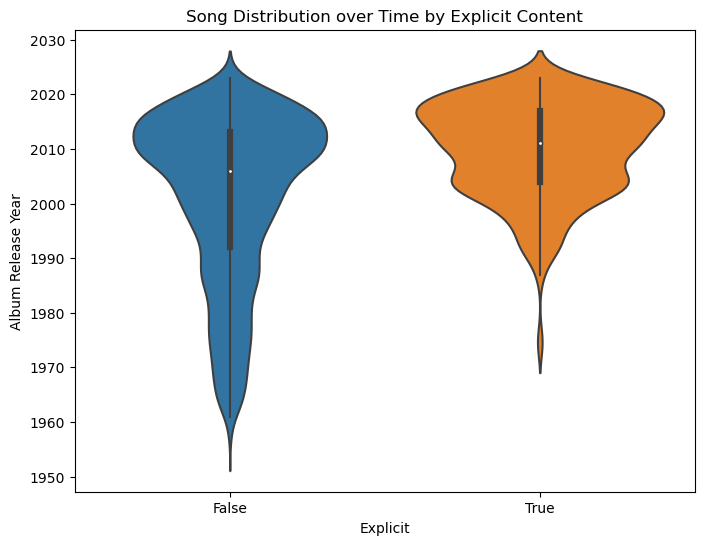

In [61]:
# Song Distribution over Time by Explicit Content (Violin Plot) 
plt.figure(figsize=(8, 6))
sns.violinplot(x='Explicit', y='Album Release Year', data=df_filled_dated)
plt.title('Song Distribution over Time by Explicit Content')
plt.show()

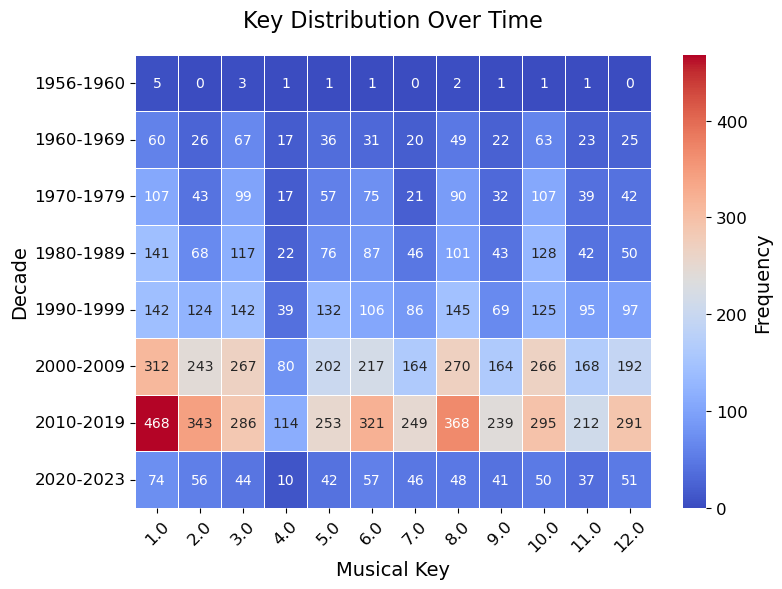

In [62]:
# Key Distribution Over Time (Heatmap)

# Group by year and key, then count occurrences
year_key_distribution = df_filled_dated.groupby(['Decade', 'Key']).size().unstack(fill_value=0)

plt.figure(figsize=(8, 6))  # Adjust figure size for better readability
# Visualize the distribution over years with annotations
sns.heatmap(year_key_distribution, cmap="coolwarm", annot=True, fmt="d", linewidths=.5, cbar=True, cbar_kws={'label': 'Frequency'})
plt.title('Key Distribution Over Time', fontsize=16, pad=20)
plt.xlabel('Musical Key', fontsize=14)
plt.ylabel('Decade', fontsize=14)
plt.xticks(fontsize=12, rotation=45)
plt.yticks(fontsize=12, rotation=0)
plt.tight_layout()  # Adjust layout to make sure everything fits without overlapping

# Customize color bar
cbar = plt.gcf().axes[-1]
cbar.set_ylabel('Frequency', fontsize=14)
cbar.tick_params(labelsize=12)

plt.show()

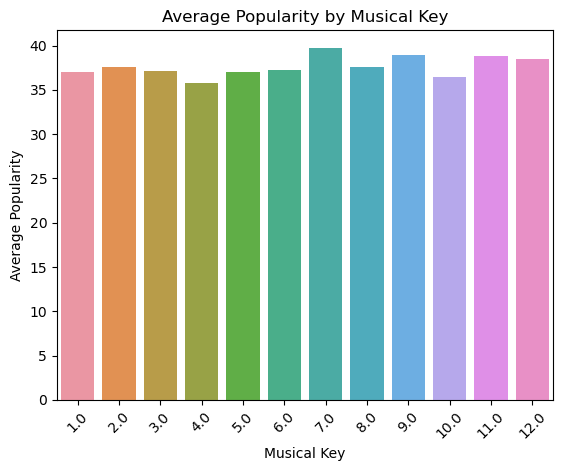

In [63]:
# Average popularity by Musical Key (Bar Plot)
avg_popularity_by_key = df_filled_dated.groupby('Key')['Popularity'].mean()

# Plot
sns.barplot(x=avg_popularity_by_key.index, y=avg_popularity_by_key.values)
plt.xlabel('Musical Key')
plt.ylabel('Average Popularity')
plt.title('Average Popularity by Musical Key')
plt.xticks(rotation=45)
plt.show()

<Figure size 800x600 with 0 Axes>

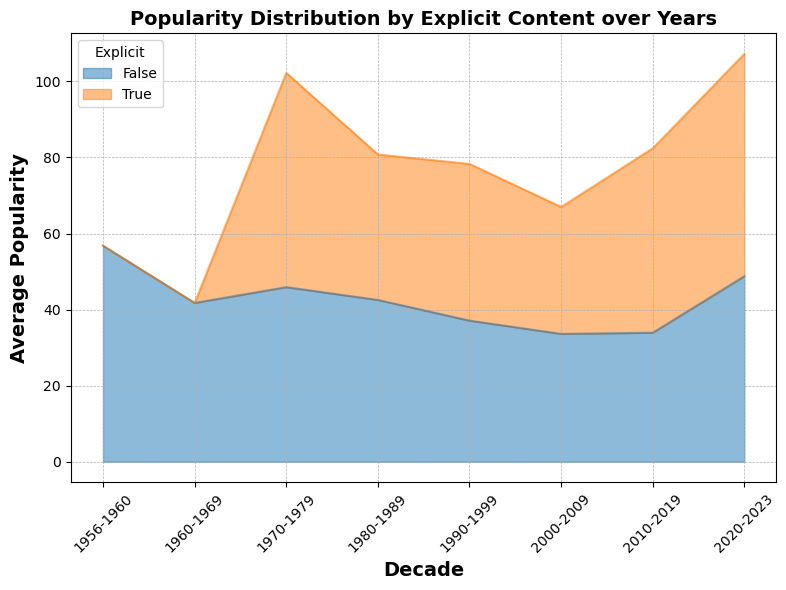

In [64]:
# Popularity Distribution by Explicit Content over Years (Area Plot)

# Group by Decade and Explicit, then calculate average popularity
popularity_by_decade_explicit = df_filled_dated.groupby(['Decade', 'Explicit'])['Popularity'].mean().unstack()

# Plotting
plt.figure(figsize=(8, 6))
popularity_by_decade_explicit.plot(kind='area', stacked=True, alpha=0.5, figsize=(8, 6))
plt.title('Popularity Distribution by Explicit Content over Years', fontsize=14, weight='bold')
plt.xlabel('Decade', fontsize=14, weight='semibold')
plt.ylabel('Average Popularity', fontsize=14, weight='semibold')
plt.xticks(rotation=45)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.legend(title='Explicit', title_fontsize='10', fontsize='10')
plt.tight_layout()
plt.show()

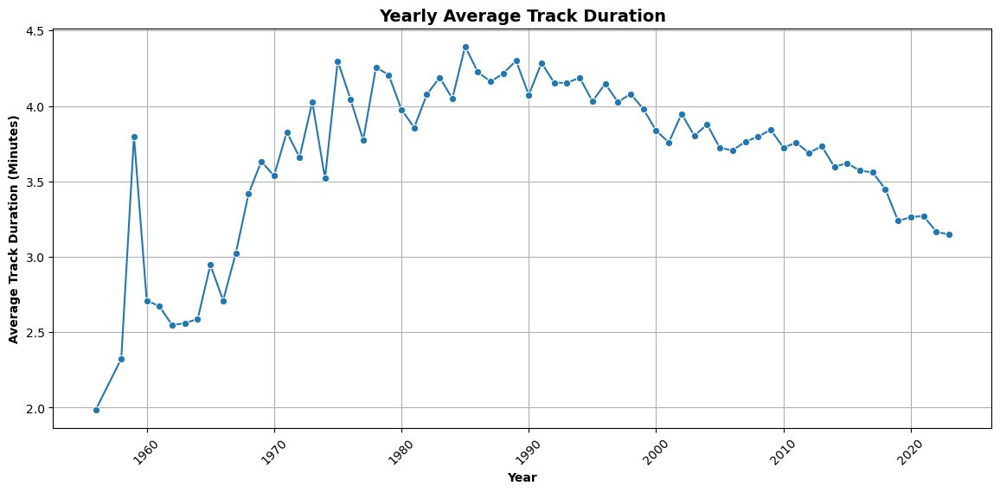

In [65]:
# Yearly Average Track Duration (Line Plot)

df_filled_dated['Track Duration (Minutes)'] = df_filled_dated['Track Duration (ms)'] / 60000  # Convert milliseconds to minutes

# Group by 'Album Release Year' and calculate the mean track duration
yearly_avg_duration = df_filled_dated.groupby('Album Release Year')['Track Duration (Minutes)'].mean().reset_index()

plt.figure(figsize=(14, 6))
sns.lineplot(x='Album Release Year', y='Track Duration (Minutes)', data=yearly_avg_duration, marker='o')
plt.xticks(rotation=45)
plt.title("Yearly Average Track Duration", fontsize=14, weight='bold')
plt.xlabel("Year", fontsize=10, weight='semibold')
plt.ylabel("Average Track Duration (Minutes)", fontsize=10, weight='semibold')
plt.grid(True)
plt.show()

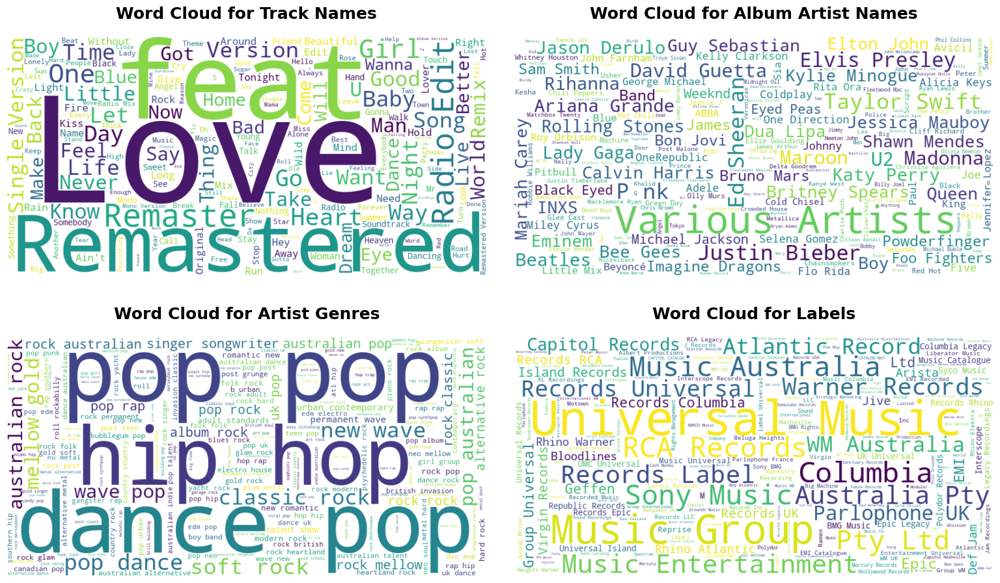

In [66]:
# Wordcloud for Track Names, Artist Names, Genres and Labels

# Adjust the function to not show the plot immediately but return the WordCloud object
def generate_word_cloud(column, title):
    text = ' '.join(df_filled_dated[column].dropna())  # Combine all text in the column, dropping NA values
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    return wordcloud, title

# Prepare a 2x2 subplot
fig, axs = plt.subplots(2, 2, figsize=(16, 10))  # Adjust figsize as needed to create more space
axs = axs.flatten()  # Flatten the 2x2 array to easily loop through it

# Columns and titles for word clouds
columns_titles = [
    ('Track Name', 'Word Cloud for Track Names'),
    ('Album Artist Name(s)', 'Word Cloud for Album Artist Names'),
    ('Artist Genres', 'Word Cloud for Artist Genres'),
    ('Label', 'Word Cloud for Labels')
]

# Generate and plot word clouds for each specified column
for ax, (column, title) in zip(axs, columns_titles):
    wordcloud, title = generate_word_cloud(column, title)
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.axis('off')  # Remove axis
    ax.set_title(title, fontsize=18, fontweight='bold', pad=20)

plt.tight_layout(pad=3.0)  # Adjust layout to make sure everything fits without overlapping, with a custom padding
plt.show()

In [67]:
df_filled_dated.columns

Index(['Track Name', 'Artist Name(s)', 'Album Name', 'Album Artist Name(s)',
       'Artist Genres', 'Label', 'Copyrights', 'Album Release Year',
       'Explicit', 'Mode', 'Key', 'Time Signature', 'Tempo', 'Loudness',
       'Track Duration (ms)', 'Popularity', 'Danceability', 'Energy',
       'Speechiness', 'Acousticness', 'Instrumentalness', 'Liveness',
       'Valence', 'Song', 'Decade', 'Album Artist', 'Broad Genre',
       'Track Duration (Minutes)'],
      dtype='object')

In [68]:
df_filled_dated.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9947 entries, 0 to 9998
Data columns (total 28 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   Track Name                9947 non-null   object  
 1   Artist Name(s)            9947 non-null   object  
 2   Album Name                9947 non-null   object  
 3   Album Artist Name(s)      9947 non-null   object  
 4   Artist Genres             9947 non-null   object  
 5   Label                     9947 non-null   object  
 6   Copyrights                9947 non-null   object  
 7   Album Release Year        9947 non-null   int64   
 8   Explicit                  9947 non-null   bool    
 9   Mode                      9947 non-null   float64 
 10  Key                       9947 non-null   float64 
 11  Time Signature            9947 non-null   float64 
 12  Tempo                     9947 non-null   float64 
 13  Loudness                  9947 non-null   float64 
 1

In [69]:
# Export the DataFrame to a CSV file
df_filled_dated.to_csv('Top 10000 Songs on Spotify 1960-Now (Cleaned and Enriched Dataframe 2.02.2024).csv', index=False)

# Machine Learning

## Random Forest Regressor and Gradient Boosting Regressor Model

In [70]:
# Step 1: Prepare Data

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
import numpy as np


# Define features and target variable without 'Popularity' in features
features = [
    'Label', 'Tempo', 'Track Duration (Minutes)', 'Danceability',
    'Energy', 'Speechiness', 'Acousticness', 'Instrumentalness', 'Liveness',
    'Valence'
]
target = 'Popularity'

# Grouping less frequent labels into 'Other' category
label_counts = df_filled_dated['Label'].value_counts()
top_n_labels = 10  # Adjust this based on your preference
top_labels = label_counts.head(top_n_labels).index
df_filled_dated['Label (Grouped)'] = df_filled_dated['Label'].where(df_filled_dated['Label'].isin(top_labels), 'Other')

# Update 'features' to use 'Label (Grouped)' instead of 'Label'
features[0] = 'Label (Grouped)'

# Separating out the features and target variable
X = df_filled_dated[features]
y = df_filled_dated[target]

# Apply one-hot encoding to the 'Label (Grouped)' column
X_encoded = pd.get_dummies(X, columns=['Label (Grouped)'])

# Splitting the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

# Feature Scaling
numeric_features = ['Tempo', 'Track Duration (Minutes)', 'Danceability', 'Energy', 'Speechiness', 'Acousticness', 'Instrumentalness', 'Liveness', 'Valence']
scaler = StandardScaler()
X_train_scaled = scaler.fit

In [71]:
# Step 2: Train a Random Forest Model

# Initialize and train the random forest model
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [72]:
# Step 3: RFM Model Evaluation

# Evaluate the model (example using R^2 score)
from sklearn.metrics import r2_score

y_pred = model.predict(X_test)
print(f"R^2 Score: {r2_score(y_test, y_pred)}")

R^2 Score: 0.14619015105632993


In [73]:
# Step 4: Feature Importance Analysis (RFM)

# Analyzing feature importances
importances = model.feature_importances_
indices = np.argsort(importances)[::-1]
encoded_feature_names = X_train.columns

print("Feature ranking:")

for f in range(X_train.shape[1]):
    print(f"{f + 1}. feature {encoded_feature_names[indices[f]]} ({importances[indices[f]]})")

Feature ranking:
1. feature Label (Grouped)_Universal Music Group (0.14846603505173406)
2. feature Track Duration (Minutes) (0.1031031554263)
3. feature Valence (0.09386093902592324)
4. feature Acousticness (0.09375776718579845)
5. feature Tempo (0.09243233145805145)
6. feature Danceability (0.09159845517400564)
7. feature Speechiness (0.09036271474614353)
8. feature Energy (0.08865205703610893)
9. feature Liveness (0.08759193885151088)
10. feature Instrumentalness (0.06201937009751175)
11. feature Label (Grouped)_Warner Records (0.009577916029076122)
12. feature Label (Grouped)_Universal Music Australia Pty. Ltd. (0.008971360177454578)
13. feature Label (Grouped)_Other (0.006066095202997522)
14. feature Label (Grouped)_Columbia (0.005066447081548677)
15. feature Label (Grouped)_Sony Music Entertainment (0.004503755617659909)
16. feature Label (Grouped)_WM Australia (0.0037738457915949346)
17. feature Label (Grouped)_RCA Records Label (0.0035965544918280965)
18. feature Label (Grouped)

In [74]:
# GBM Model Evaluation

from sklearn.ensemble import GradientBoostingRegressor

# Instantiate the model
gbm_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

# Fit the model
gbm_model.fit(X_train, y_train)

# Make predictions
y_pred_gbm = gbm_model.predict(X_test)

# Evaluate the model
from sklearn.metrics import r2_score
print("R^2 Score for GBM:", r2_score(y_test, y_pred_gbm))

R^2 Score for GBM: 0.19812748088924592


In [75]:
# Analyzing feature importances (GBM)
importances = gbm_model.feature_importances_
indices = np.argsort(importances)[::-1]
encoded_feature_names = X_train.columns

print("Feature ranking:")

for f in range(X_train.shape[1]):
    print(f"{f + 1}. feature {encoded_feature_names[indices[f]]} ({importances[indices[f]]})")

Feature ranking:
1. feature Label (Grouped)_Universal Music Group (0.5999412606594086)
2. feature Track Duration (Minutes) (0.05151685872735003)
3. feature Acousticness (0.04503502026193494)
4. feature Label (Grouped)_Warner Records (0.038870847032057954)
5. feature Label (Grouped)_Universal Music Australia Pty. Ltd. (0.03471994771145845)
6. feature Liveness (0.02850605483518056)
7. feature Danceability (0.02761113978207033)
8. feature Valence (0.02443414152139757)
9. feature Tempo (0.023186687317831647)
10. feature Energy (0.023097875020895855)
11. feature Instrumentalness (0.022144313162024393)
12. feature Label (Grouped)_Columbia (0.019916589224384388)
13. feature Speechiness (0.017574075547077062)
14. feature Label (Grouped)_Sony Music Entertainment (0.014573385041343402)
15. feature Label (Grouped)_WM Australia (0.014334407876698074)
16. feature Label (Grouped)_Capitol Records (0.006916264434114133)
17. feature Label (Grouped)_Epic (0.005013824720325491)
18. feature Label (Grouped

## Recommendation System

In [76]:
# Recommendation System

import numpy as np

# Function to recommend similar songs based on track features
def recommend_similar_songs(song_name, df_filled_dated, top_n=5):
    # Adjusting column names as per your DataFrame
    song_features = df_filled_dated[df_filled_dated['Song'] == song_name][['Energy', 'Valence', 'Danceability', 'Acousticness', 'Instrumentalness']]
    if song_features.empty:
        print("Song not found in the dataset.")
        return

    # Preparing the matrix of features for all songs for Euclidean distance calculation
    features_for_clustering = df_filled_dated[['Energy', 'Valence', 'Danceability', 'Acousticness', 'Instrumentalness']].to_numpy()

    # Calculate the Euclidean distance between the selected song and all other songs
    distances = np.sqrt(np.sum((features_for_clustering - song_features.values[0])**2, axis=1))

    # Get the indices of the most similar songs
    similar_song_indices = np.argsort(distances)[1:top_n + 1]  # Excluding the first one as it is the song itself

    # Display the recommended similar songs
    print(f"Recommended Songs Similar to '{song_name}':")
    for idx in similar_song_indices:
        recommended_song = df_filled_dated.iloc[idx]['Song']  # Adjusted to 'Song'
        print(f"- {recommended_song}")

# Usage
recommend_similar_songs("Down - Jay Sean", df_filled_dated, top_n=10)

Recommended Songs Similar to 'Down - Jay Sean':
- Buffalo Stance - Various Artists
- Say You'll Be There - Spice Girls
- Right Round - Flo Rida
- Don't Tell Me - Madonna
- Somethin' 4 Da Honeyz - Montell Jordan
- Lifestyle (feat. Adam Levine) - Jason Derulo, Adam Levine
- We Don't Talk Anymore - 2001 Remaster - Cliff Richard
- Beautiful Mistakes (feat. Megan Thee Stallion) - Maroon 5, Megan Thee Stallion
- Beautiful Mistakes (feat. Megan Thee Stallion) - Maroon 5
- Better Days (NEIKED x Mae Muller x Polo G) - NEIKED, Mae Muller, Polo G
